In [11]:
### 0.0 loading package 
import numpy as np
import pandas as pd
#import modin.pandas as modin_pd
import matplotlib.pyplot as plt 
from matplotlib import pylab
import seaborn as sns 
from sklearn.metrics.pairwise import cosine_similarity
from statannot import add_stat_annotation
import matplotlib as mpl
from scipy import stats, cluster
import glob
import re
from sklearn.metrics import mean_squared_error, r2_score
from statsmodels.stats import multitest
from scipy.stats.mstats import winsorize
#import numpy_ext as npext
#from adjustText import adjust_text
#from numpy_ext import rolling_apply
#from venn import venn

#from scipy.stats import hypergeom
#from statsmodels.sandbox.stats.multicomp import multipletests
from statsmodels.stats.multitest import multipletests

#import pybedtools

import os
## path = "C:\\temp\myFolder\example\\"
## newPath = path.replace(os.sep, '/')
def change_slash_in_path(path):
    newpath = path.replace(os.sep, '/')
    return newpath


#from adjustText import adjust_text

import warnings
warnings.simplefilter('ignore')

## load_large_dataFrame
def load_large_dataFrame(input_file, sep=",", header=0, index_col=0, chunksize=100000, compressed=False):
    if compressed:
        TextFileReader = pd.read_csv(input_file, chunksize=chunksize, sep=sep, header=header,index_col=index_col, compression='gzip')
    else:
        TextFileReader = pd.read_csv(input_file, chunksize=chunksize, sep=sep, header=header,index_col=index_col)
    dfList=[]
    for df in TextFileReader:
        dfList.append(df)
    final_df = pd.concat(dfList,sort=False)
    return final_df

In [2]:
from sklearn.manifold import TSNE
#import umap

## 1. Generate mutrate/coverage/mutant matrix

### 1.1. loading sample list

In [3]:
sample_lst = load_large_dataFrame("../../../Data/RiboSwitch/MUX11957.sample_list.txt", sep="\t")
sample_lst = sample_lst.reset_index()
sample_lst.index = sample_lst['sample_id']
sample_lst

,sample_id,transfer,treatment,ref,cell_id
sample_id,,,,,
RHX644,RHX644,in_vivo,DMSO,WT,W1
RHX645,RHX645,in_vivo,NAI_N3,WT,W1
RHX646,RHX646,in_vivo,NAI_N3,WT,W9
RHX647,RHX647,in_vivo,NAI_N3,WT,W17
RHX651,RHX651,in_vivo,DMSO,WT,W2
...,...,...,...,...,...
RHX751,RHX751,in_vitro,NAI_N3,MT,M16
RHX706,RHX706,18s,DMSO,WT,R1
RHX713,RHX713,18s,DMSO,WT,R2


In [4]:
sample_lst[['transfer','treatment','ref']].value_counts()

transfer  treatment  ref
in_vivo   NAI_N3     MT     24
                     WT     24
in_vitro  NAI_N3     MT     20
                     WT     20
          DMSO       WT      5
in_vivo   DMSO       MT      4
                     WT      4
in_vitro  DMSO       MT      3
18s       DMSO       WT      2
          NAI_N3     WT      2
dtype: int64

### 1.2 loading mutrate/coverage/mutant matrix

In [13]:
dirs = glob.glob("../../../Data/RiboSwitch/mutrate_matrix/R*")
concat_mutant = []
concat_mutrate = []
concat_coverage = []

for dir in dirs:
    dir = change_slash_in_path(dir)
    sample_id = dir.split("/")[-1].split("_")[0]
    #print (sample_id)
    brc_output = load_large_dataFrame("{}/{}.mutrate.txt.gz".format(dir,sample_id), sep="\t", header=None, index_col=None)
    col_names = ["gene","pos","end","id","mutrate","strand","coverage","mutant","normalized_cov","gene_expr","ntref","detail"]
    brc_output.columns = col_names
    brc_output = brc_output.set_index(['gene', 'pos'])
    mutrate_df = brc_output[['mutrate']]
    coverage_df = brc_output[['coverage']]
    mutant_df = brc_output[['mutant']]
    mutrate_df.columns = [sample_id]
    mutant_df.columns = [sample_id]
    coverage_df.columns = [sample_id]
    
    concat_mutant.append(mutant_df)
    concat_mutrate.append(mutrate_df)    
    concat_coverage.append(coverage_df)
    
mutant_df = pd.concat(concat_mutant, axis=1)
mutrate_df = pd.concat(concat_mutrate, axis=1)
coverage_df = pd.concat(concat_coverage, axis=1)

### add columns

mutrate_df = mutrate_df.loc[:, sample_lst.index]
mutrate_df.columns = pd.MultiIndex.from_frame(sample_lst)
mutrate_df

mutant_df = mutant_df.loc[:, sample_lst.index]
mutant_df.columns = pd.MultiIndex.from_frame(sample_lst)
mutant_df

coverage_df = coverage_df.loc[:, sample_lst.index]
coverage_df.columns = pd.MultiIndex.from_frame(sample_lst)
coverage_df

sample_id           RHX644  RHX645  RHX646  RHX647  RHX651  RHX652  RHX653  \
transfer           in_vivo in_vivo in_vivo in_vivo in_vivo in_vivo in_vivo   
treatment             DMSO  NAI_N3  NAI_N3  NAI_N3    DMSO  NAI_N3  NAI_N3   
ref                     WT      WT      WT      WT      WT      WT      WT   
cell_id                 W1      W1      W9     W17      W2      W2     W10   
gene           pos                                                           
Tetrahymena_WT 1    3000.0  2179.0  1595.0  1756.0  4294.0  2297.0  2344.0   
               2    3934.0  2709.0  2026.0  2176.0  5692.0  2887.0  2878.0   
               3    5346.0  3524.0  2765.0  2723.0  7840.0  3729.0  3616.0   
               4    5817.0  3783.0  2942.0  2893.0  8513.0  4034.0  3843.0   
               5    6626.0  4281.0  3349.0  3272.0  9750.0  4648.0  4323.0   
...                    ...     ...     ...     ...     ...     ...     ...   
human_large    771     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
               772     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
               773     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
               774     NaN     NaN     NaN     NaN     NaN     NaN     NaN   
               745     NaN     NaN     NaN     NaN     NaN     NaN     NaN   

sample_id           RHX654  RHX658  RHX659  ...   RHX744   RHX745   RHX746  \
transfer           in_vivo in_vivo in_vivo  ... in_vitro in_vitro in_vitro   
treatment           NAI_N3    DMSO  NAI_N3  ...   NAI_N3   NAI_N3     DMSO   
ref                     WT      WT      WT  ...       MT       MT       MT   
cell_id                W18      W3      W3  ...       M7      M15       M4   
gene           pos                          ...                              
Tetrahymena_WT 1    1087.0  2963.0  2395.0  ...      NaN      NaN      NaN   
               2    1294.0  3824.0  3078.0  ...      NaN      NaN      NaN   
               3    1577.0  5164.0  4172.0  ...      NaN      NaN      NaN   
               4    1670.0  5604.0  4555.0  ...      NaN      NaN      NaN   
               5    1865.0  6365.0  5193.0  ...      NaN      NaN      NaN   
...                    ...     ...     ...  ...      ...      ...      ...   
human_large    771     NaN     NaN     NaN  ...      NaN      NaN      NaN   
               772     NaN     NaN     NaN  ...      NaN      NaN      NaN   
               773     NaN     NaN     NaN  ...      NaN      NaN      NaN   
               774     NaN     NaN     NaN  ...      NaN      NaN      NaN   
               745     NaN     NaN     NaN  ...      NaN      NaN      NaN   

sample_id            RHX749   RHX750   RHX751 RHX706 RHX713 RHX720 RHX727  
transfer           in_vitro in_vitro in_vitro    18s    18s    18s    18s  
treatment            NAI_N3   NAI_N3   NAI_N3   DMSO   DMSO NAI_N3 NAI_N3  
ref                      MT       MT       MT     WT     WT     WT     WT  
cell_id                 M20       M8      M16     R1     R2     R1     R2  
gene           pos                                                         
Tetrahymena_WT 1        NaN      NaN      NaN    NaN    3.0    1.0    1.0  
               2        NaN      NaN      NaN    NaN    4.0    2.0    1.0  
               3        NaN      NaN      NaN    NaN    4.0    2.0    2.0  
               4        NaN      NaN      NaN    NaN    4.0    2.0    2.0  
               5        NaN      NaN      NaN    NaN    4.0    2.0    2.0  
...                     ...      ...      ...    ...    ...    ...    ...  
human_large    771      NaN      NaN      NaN    NaN    NaN    NaN    NaN  
               772      NaN      NaN      NaN    NaN    NaN    NaN    NaN  
               773      NaN      NaN      NaN    NaN    NaN    NaN    NaN  
               774      NaN      NaN      NaN    NaN    NaN    NaN    NaN  
               745      NaN      NaN      NaN    NaN    NaN    NaN    NaN  

[12370 rows x 108 columns]

### 1.3 generate reactivity for each condition

In [14]:
avg_coverage = coverage_df.groupby(level=['transfer', 'treatment', 'ref'], axis=1).mean().sort_index()

coverage_threshold = 1000
concat_categories_lst = []
for (transfer,ref), subset in mutrate_df.groupby(level=['transfer','ref'], axis=1):
    print (transfer, ref)
    local_coverage_df = avg_coverage.loc[avg_coverage.loc[:, (avg_coverage.columns.get_level_values('transfer')==transfer)&(avg_coverage.columns.get_level_values('ref')==ref)].min(axis=1) > coverage_threshold]
    
    dmso_df = subset.xs('DMSO', level="treatment", axis=1, drop_level=False)
    nain3_df = subset.xs('NAI_N3', level="treatment", axis=1, drop_level=False)
    nain3_df = nain3_df.sort_index()

    temp_dmso_df = pd.concat([dmso_df.mean(axis=1)]*nain3_df.columns.size, axis=1)
    temp_dmso_df.columns = nain3_df.columns
    temp_dmso_df = temp_dmso_df.loc[nain3_df.index]

    reac_df = nain3_df - temp_dmso_df
    reac_df = reac_df.loc[reac_df.index.isin(local_coverage_df.index)]
    reac_df
    
    ## change ref labels on gene
    concat_lst = []
    for gene, gene_subset in reac_df.groupby(level='gene'):
        if "WT" in gene:
            gene = gene.split("_")[0]
        elif "MT" in gene:
            gene = gene.split("_")[0]
        print ("#"+gene+"#")
        idx_df = gene_subset.index.to_frame()
        idx_df.index = list(range(idx_df.index.size))
        idx_df['gene'] = gene
        idx_df['gene'] = idx_df['gene'].astype(str)
        idx_df['pos'] = idx_df['pos'].astype(np.int64)
        
        gene_subset.index = pd.MultiIndex.from_frame(idx_df)
        concat_lst.append(gene_subset)
    reac_df = pd.concat(concat_lst)
    concat_categories_lst.append(reac_df)
reac_df = pd.concat(concat_categories_lst, axis=1)
reac_df = reac_df.sort_index()
reac_df

18s WT
#human_small#
in_vitro MT
#Den1#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#
in_vitro WT
#Den1#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#
in_vivo MT
#Den1#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#
in_vivo WT
#Den1#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#


sample_id    RHX720 RHX727    RHX704    RHX705    RHX711    RHX712    RHX718  \
transfer        18s    18s  in_vitro  in_vitro  in_vitro  in_vitro  in_vitro   
treatment    NAI_N3 NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3   
ref              WT     WT        MT        MT        MT        MT        MT   
cell_id          R1     R2        M1        M9        M2       M10        M3   
gene     pos                                                                   
Den1     1      NaN    NaN -0.037864 -0.056180 -0.068342 -0.103428 -0.034311   
         2      NaN    NaN -0.060269 -0.088567 -0.086984 -0.123338 -0.055240   
         3      NaN    NaN -0.005395 -0.031260 -0.012724 -0.053158  0.001523   
         4      NaN    NaN -0.010114 -0.012350  0.002716 -0.006607 -0.000837   
         5      NaN    NaN  0.035343  0.034732  0.020698  0.030428  0.034171   
...             ...    ...       ...       ...       ...       ...       ...   
ypaA_FMN 348    NaN    NaN  0.023772 -0.004336  0.025160  0.017368  0.038151   
         349    NaN    NaN  0.002174  0.007090 -0.003921 -0.000998 -0.004192   
         350    NaN    NaN  0.075066  0.016610  0.089057  0.031386  0.122230   
         351    NaN    NaN -0.003801 -0.009152  0.006012 -0.006546  0.003061   
         352    NaN    NaN -0.003158 -0.006723  0.000281 -0.004813  0.002327   

sample_id       RHX719    RHX725    RHX726  ...    RHX675    RHX680    RHX681  \
transfer      in_vitro  in_vitro  in_vitro  ...   in_vivo   in_vivo   in_vivo   
treatment       NAI_N3    NAI_N3    NAI_N3  ...    NAI_N3    NAI_N3    NAI_N3   
ref                 MT        MT        MT  ...        WT        WT        WT   
cell_id            M11        M4       M12  ...       W21        W6       W14   
gene     pos                                ...                                 
Den1     1   -0.072488  0.016749 -0.066407  ... -0.193869 -0.168942 -0.173057   
         2   -0.093356  0.005044 -0.090691  ... -0.062333 -0.056682 -0.063918   
         3   -0.048684  0.030856 -0.040692  ... -0.016283 -0.002033 -0.009850   
         4   -0.003349 -0.020717 -0.021741  ...  0.015094  0.016529  0.017882   
         5    0.022478  0.029093  0.023118  ...  0.082173  0.082564  0.064888   
...                ...       ...       ...  ...       ...       ...       ...   
ypaA_FMN 348  0.020453  0.040112  0.019689  ... -0.009026 -0.015788 -0.017730   
         349  0.003549 -0.000822  0.003346  ...  0.010589  0.004716 -0.001630   
         350  0.023255  0.125221  0.046485  ... -0.102872 -0.086869 -0.064663   
         351 -0.007952  0.001364 -0.006716  ... -0.020547 -0.032125 -0.014189   
         352 -0.015246  0.001284 -0.002186  ...       NaN       NaN       NaN   

sample_id       RHX682    RHX687    RHX688    RHX689    RHX694    RHX695  \
transfer       in_vivo   in_vivo   in_vivo   in_vivo   in_vivo   in_vivo   
treatment       NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3   
ref                 WT        WT        WT        WT        WT        WT   
cell_id            W22        W7       W15       W23        W8       W16   
gene     pos                                                               
Den1     1   -0.151384 -0.173590 -0.213617 -0.156153 -0.173694 -0.235244   
         2   -0.043907 -0.062126 -0.060507 -0.055092 -0.050170 -0.068527   
         3    0.006125  0.005422  0.002205  0.003638  0.017367  0.009259   
         4    0.025384  0.027015  0.036447  0.018907  0.038364  0.053915   
         5    0.077796  0.069708  0.094430  0.061369  0.077227  0.101986   
...                ...       ...       ...       ...       ...       ...   
ypaA_FMN 348  0.002353 -0.004690 -0.004015  0.005795  0.022653  0.020402   
         349  0.007083  0.003912  0.012059  0.008151 -0.000145  0.002692   
         350 -0.030104 -0.045579 -0.034558 -0.053431  0.011304  0.008581   
         351 -0.013964 -0.016938 -0.014886 -0.026900 -0.013649 -0.024358   
         352       NaN       NaN       NaN   

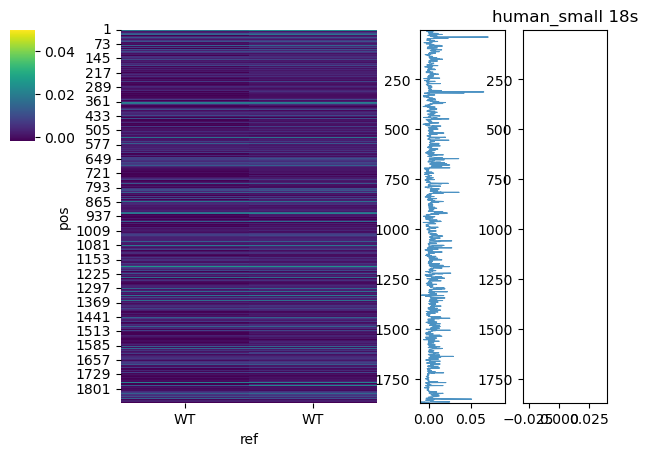

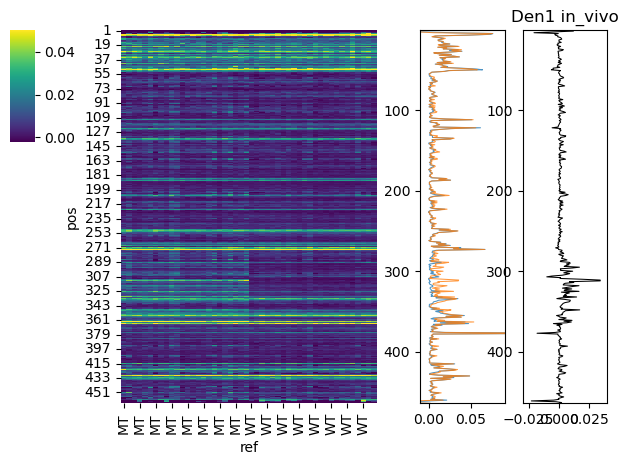

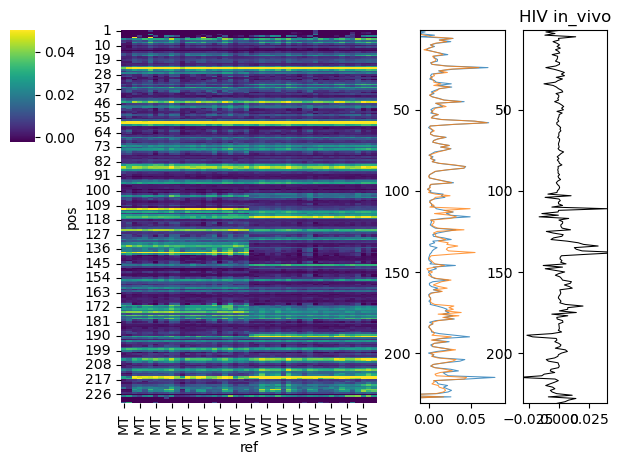

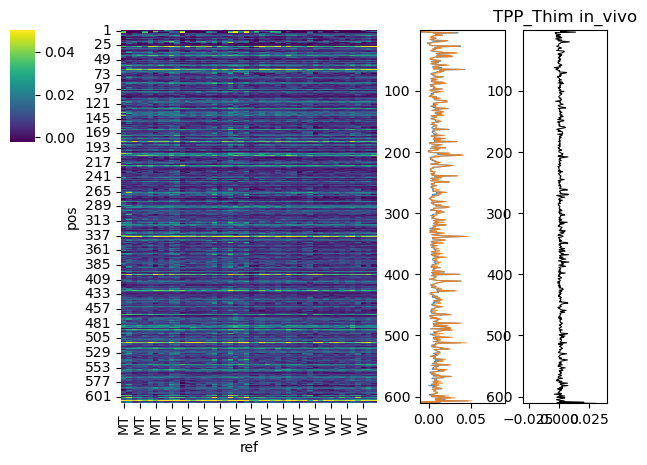

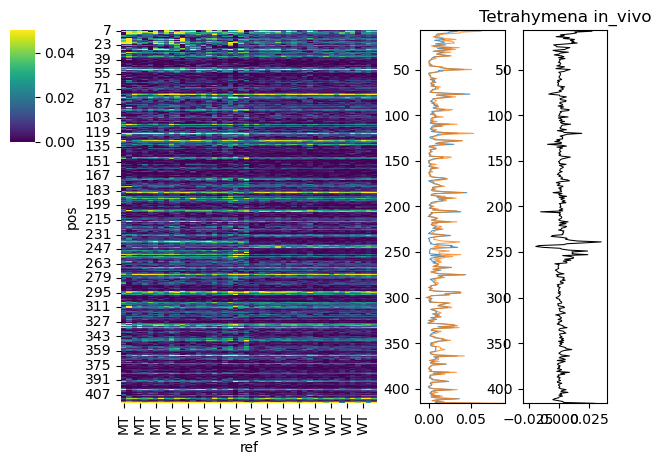

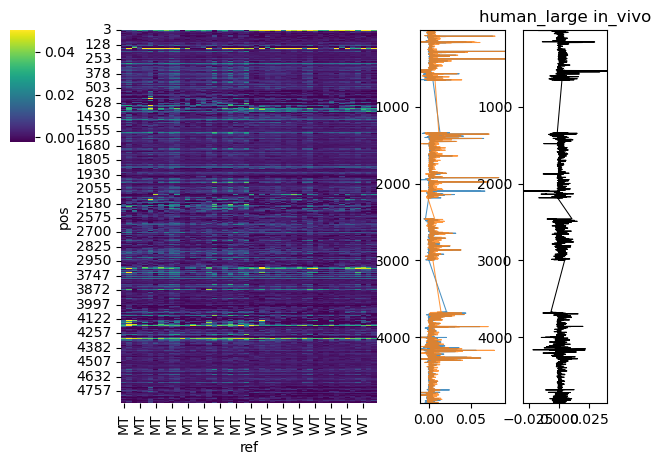

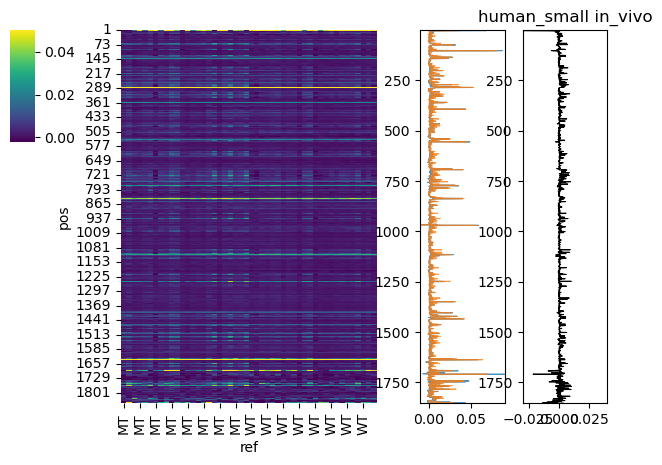

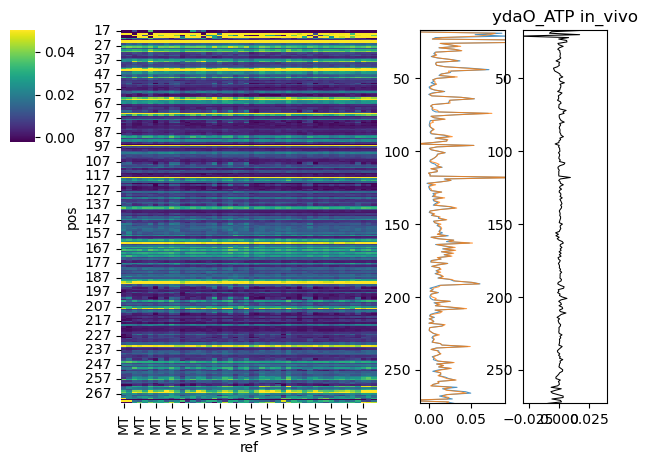

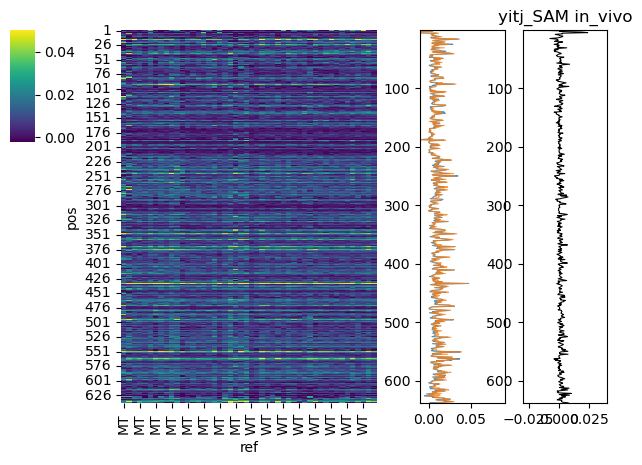

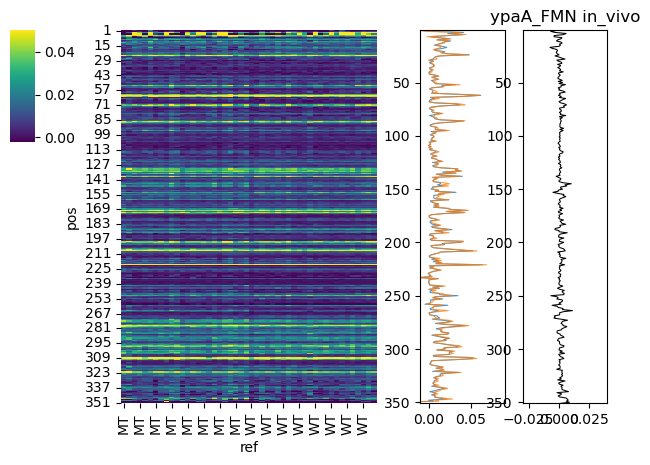

In [17]:
for transfer, subset in reac_df.groupby(level='transfer', axis=1):
    #print (subset.dropna(how="all"))
    if transfer == "in_vitro":
        continue
    for gene, gene_subset in subset.dropna(how="all").groupby(level="gene"):
        #print (gene_subset)
        
        col_df = gene_subset.columns.to_frame()
        col_df.index = list(range(col_df.index.size))
        #print (col_df)
        labels = col_df['ref']
        flatui = ["#F5F5F5", "#32CD32"]
        lut = dict(zip(["WT","MT"], sns.color_palette(flatui)))
        col_ref_colors = labels.map(lut)
        col_ref_colors
        
        plot_reac = gene_subset.dropna()
        plot_reac.index = plot_reac.index.get_level_values('pos')
        plot_reac.columns = plot_reac.columns.get_level_values('ref')
        #sns.clustermap(data=plot_reac.sort_index(axis=1), row_cluster=False, cmap="coolwarm", vmin=-0.025, vmax=0.05,
        #               col_colors=[col_ref_colors],colors_ratio=(0.01,0.02),
        #               col_cluster=False)
        
        
        #
        
        
        fig = plt.figure(constrained_layout=False, figsize=(8,8))
        gridspec = fig.add_gridspec(nrows=60, ncols=75, left=0.1, right=0.9, bottom=0.2, top=0.9, wspace=0.1, hspace=0.1)
        heatmap_cbar_ax = fig.add_subplot(gridspec[12:24, 2:5])
        reac_heatmap_ax = fig.add_subplot(gridspec[12:52, 15:45])
        reac_curve_ax = fig.add_subplot(gridspec[12:52, 50:60])
        diff_curve_ax = fig.add_subplot(gridspec[12:52, 62:72])
        
        if gene == "Tetrahymena":
            sns.heatmap(data=plot_reac.sort_index(axis=1), cmap="viridis", vmin=-0.0, vmax=0.05, ax=reac_heatmap_ax, cbar_ax=heatmap_cbar_ax)
        else:
            sns.heatmap(data=plot_reac.sort_index(axis=1), cmap="viridis", vmin=-0.002, vmax=0.05, ax=reac_heatmap_ax, cbar_ax=heatmap_cbar_ax)
        
        plot_stacked_reac = plot_reac.stack().to_frame('reac').reset_index()
        #sns.lineplot(data=plot_stacked_reac, x='reac', y="pos", orient="y", ax=reac_curve_ax, hue="ref",  lw=0.3)
        wt_plot_stacked_reac = plot_stacked_reac.loc[plot_stacked_reac['ref']=="WT"].groupby('pos').mean()
        mt_plot_stacked_reac = plot_stacked_reac.loc[plot_stacked_reac['ref']=="MT"].groupby('pos').mean()
        
        diff_reac = mt_plot_stacked_reac - wt_plot_stacked_reac
        wt_plot_stacked_reac = wt_plot_stacked_reac.reset_index()
        mt_plot_stacked_reac = mt_plot_stacked_reac.reset_index()
        diff_reac = diff_reac.reset_index()
        
        reac_curve_ax.plot(wt_plot_stacked_reac["reac"], wt_plot_stacked_reac['pos'], lw=0.75,alpha=0.8)
        reac_curve_ax.plot(mt_plot_stacked_reac["reac"], mt_plot_stacked_reac['pos'], lw=0.75,alpha=0.8)
        
        reac_curve_ax.set_ylim(wt_plot_stacked_reac['pos'].min(), wt_plot_stacked_reac['pos'].max())
        reac_curve_ax.invert_yaxis()
        reac_curve_ax.set_xlim(-0.01, 0.09)
        
        diff_curve_ax.plot(diff_reac["reac"], diff_reac['pos'], lw=0.75,alpha=1, color="black")
        diff_curve_ax.set_ylim(wt_plot_stacked_reac['pos'].min(), wt_plot_stacked_reac['pos'].max())
        diff_curve_ax.invert_yaxis()
        diff_curve_ax.set_xlim(-0.03, 0.04)
        #diff_curve_ax.set_ytickslabel()
        
        
        plt.title("{} {}".format(gene, transfer))
        plt.tight_layout()
        #plt.savefig("Figures/Fig_x2.lineplot_with_different_areas/reac_heatmap.{}.svg".format(gene))
        plt.show()

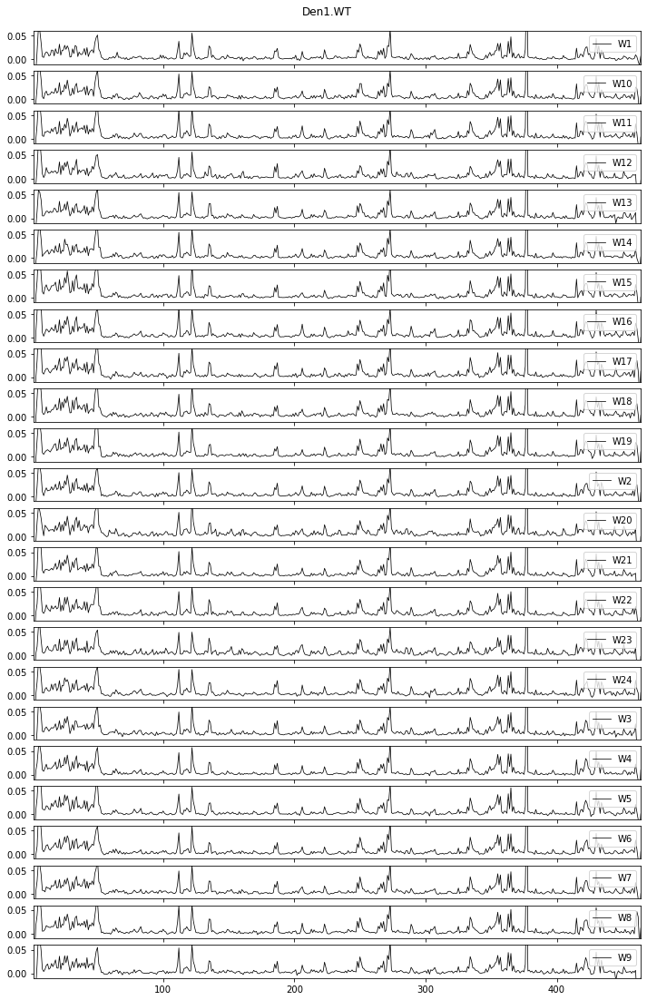

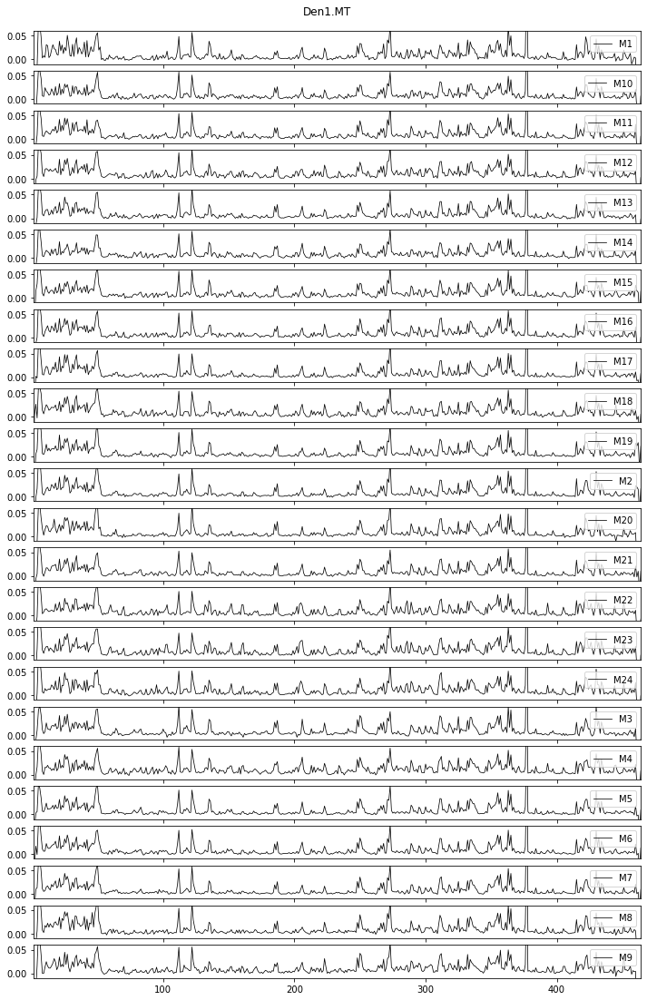

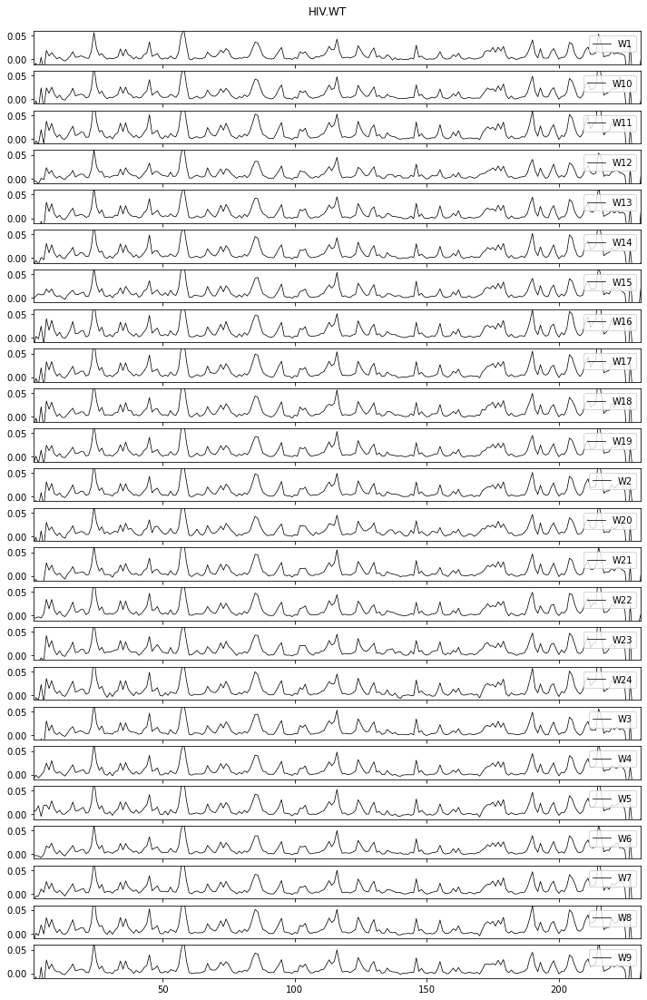

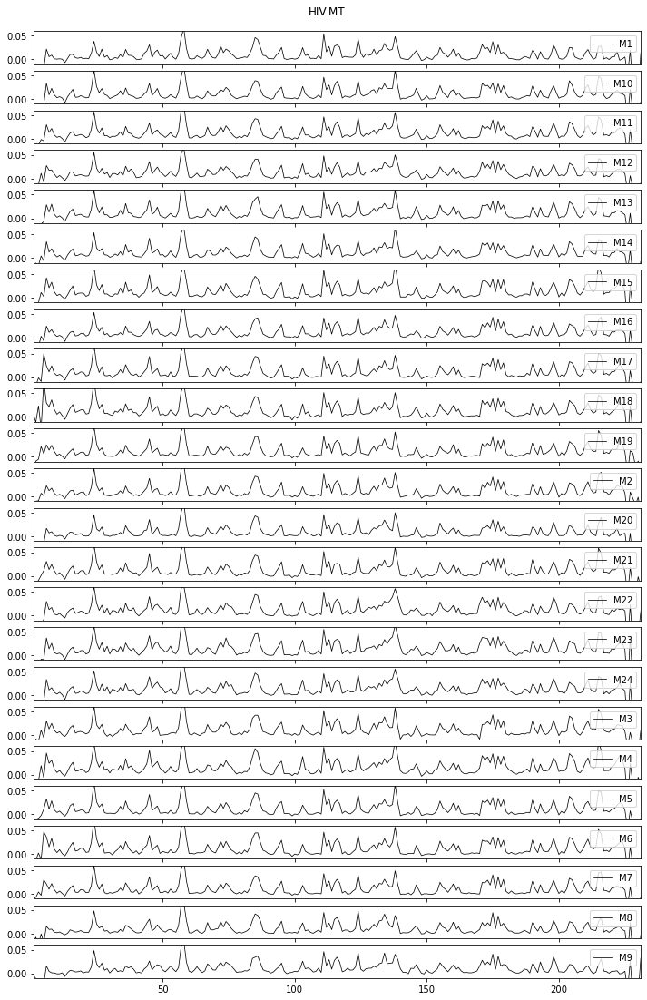

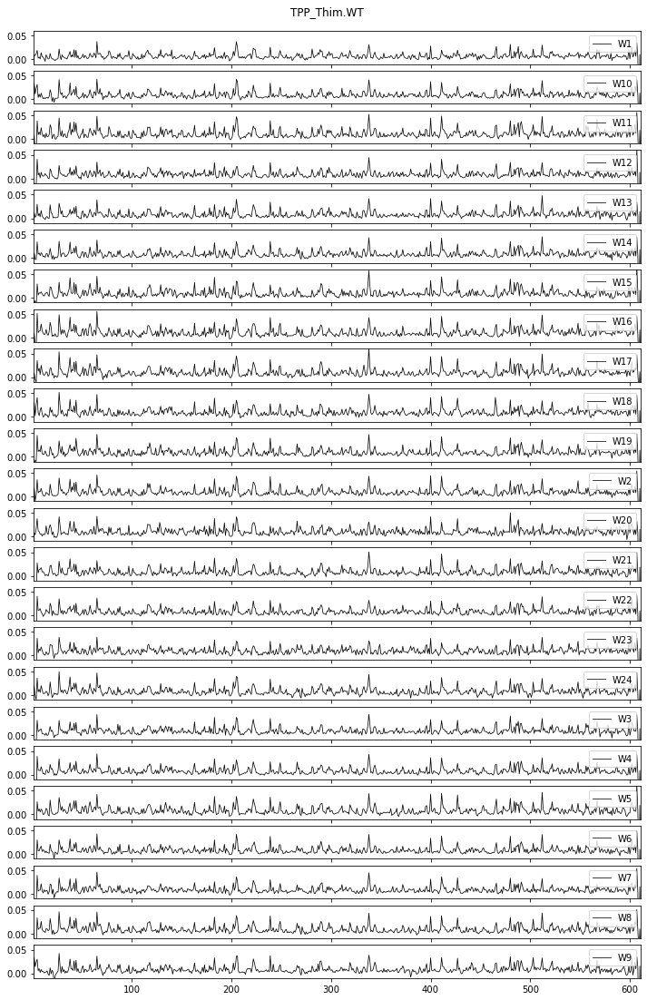

...

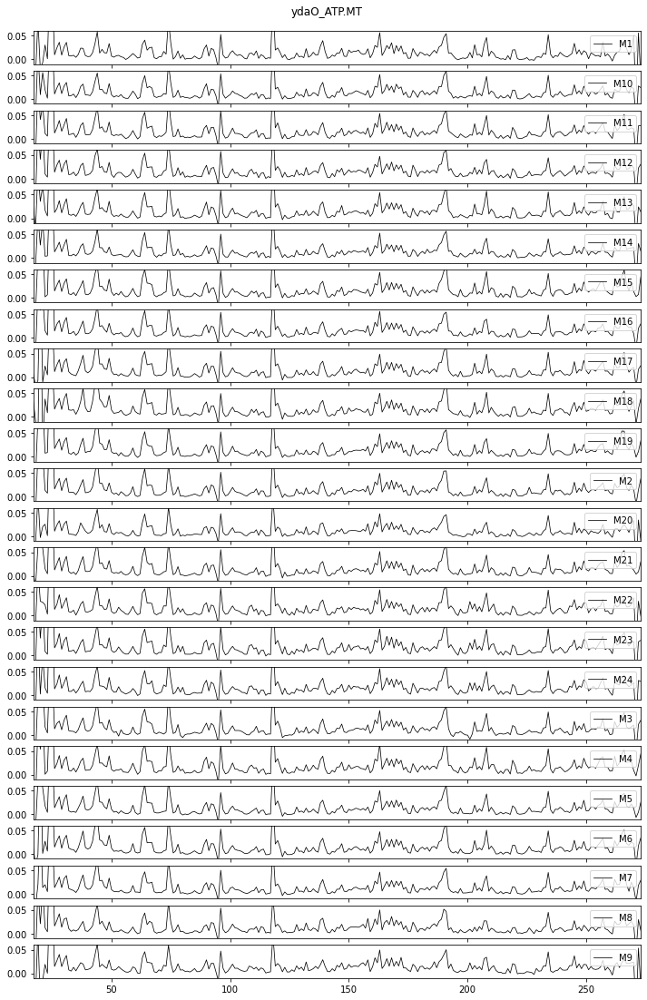

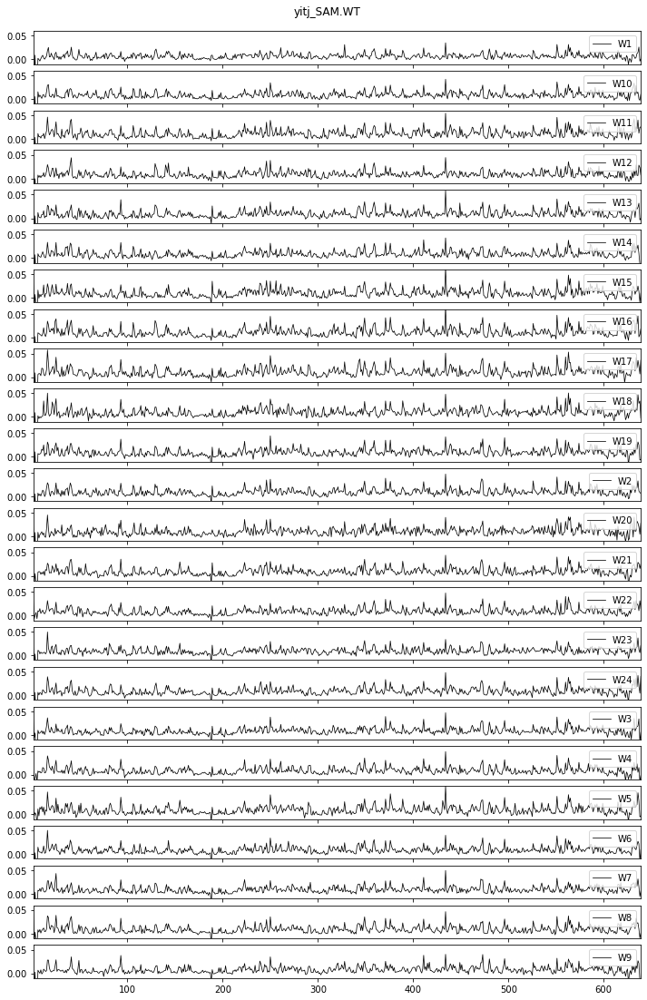

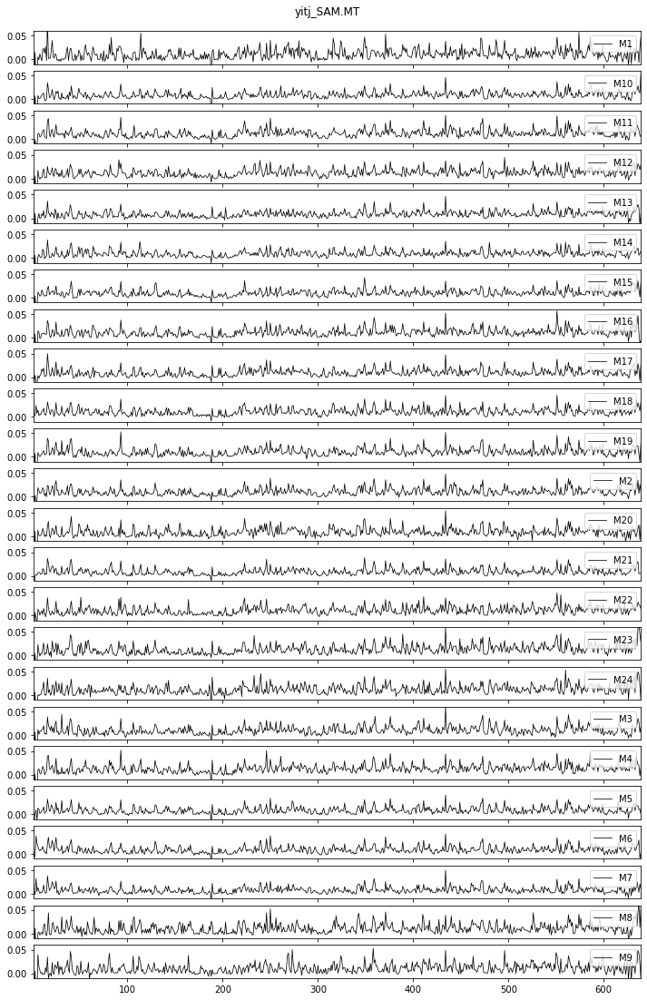

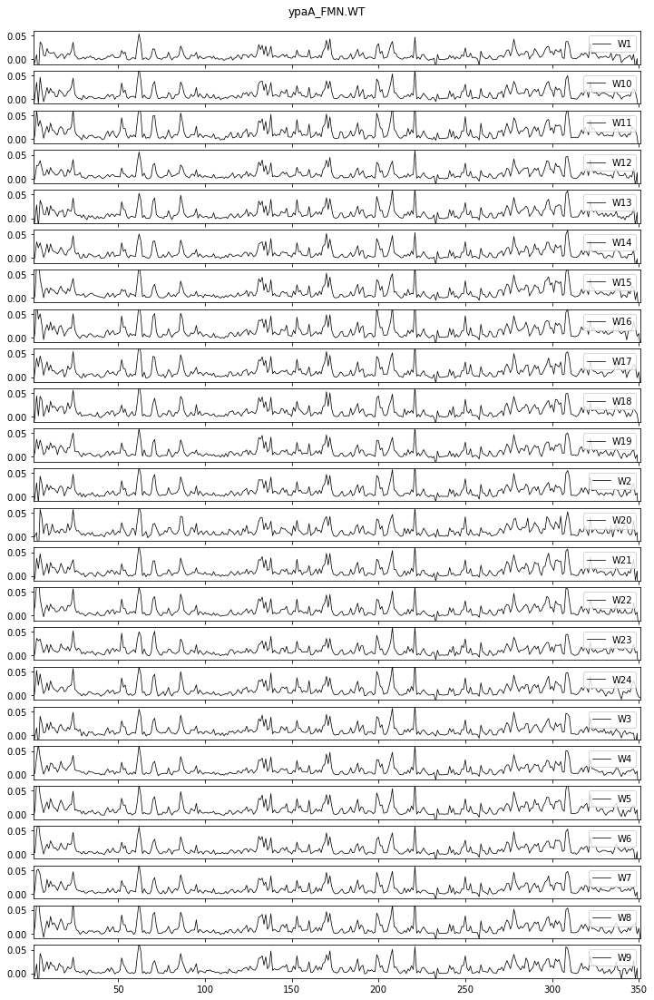

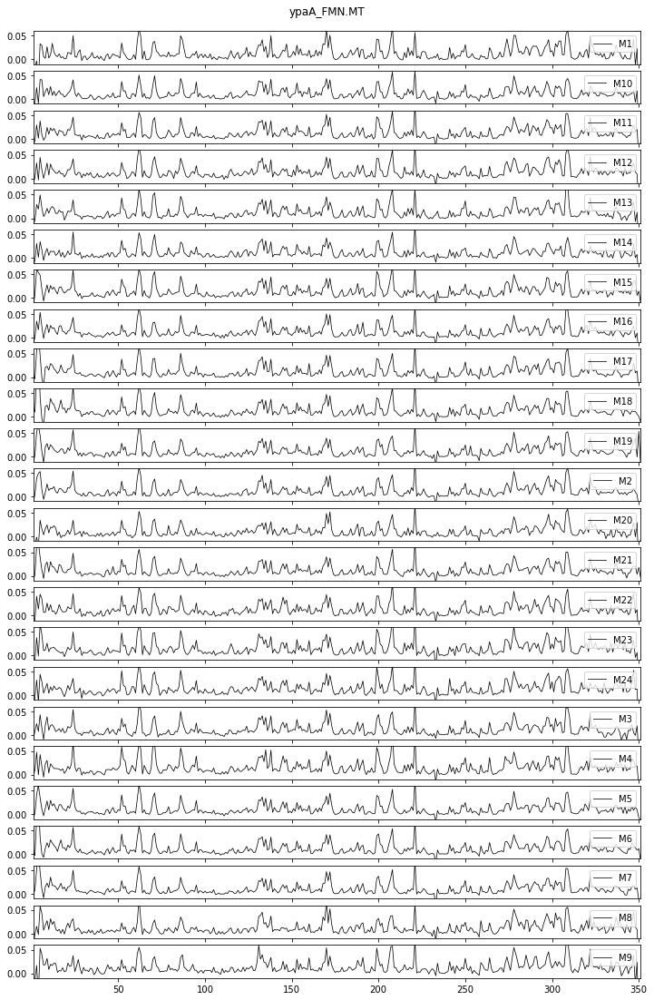

In [34]:
for transfer, subset in reac_df.groupby(level='transfer', axis=1):
    #print (subset.dropna(how="all"))
    if transfer == "in_vitro":
        continue
    for gene, gene_subset in subset.dropna(how="all").groupby(level="gene"):
        if gene_subset.columns.size < 5:
            continue
        plot_reac = gene_subset.dropna()
        plot_reac.index = plot_reac.index.get_level_values('pos')
        #plot_reac.columns = plot_reac.columns.get_level_values('ref')
        
        plot_stacked_reac = plot_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
        #sns.lineplot(data=plot_stacked_reac, x='reac', y="pos", orient="y", ax=reac_curve_ax, hue="ref",  lw=0.3)
        wt_plot_stacked_reac = plot_stacked_reac.loc[plot_stacked_reac['ref']=="WT"]
        mt_plot_stacked_reac = plot_stacked_reac.loc[plot_stacked_reac['ref']=="MT"]
        
        def plot_lineplot_clusters(wt_plot_stacked_reac, gene, group):
            fig, axs = plt.subplots(wt_plot_stacked_reac['cell_id'].unique().size, 1, figsize=(12, wt_plot_stacked_reac['cell_id'].unique().size*0.8),
                                    sharex=True, sharey=True)
            n = 0
            for cell_id, cell_reac in wt_plot_stacked_reac.groupby('cell_id'):
                #print (cell_id)
                axs[n].plot(cell_reac['pos'], cell_reac["reac"], lw=0.75,alpha=1, color="black", label=cell_id)
                #axs[n].set_xticklabels([])
                axs[n].legend(loc="upper right")
                n += 1
            axs[n-1].set_xlim(wt_plot_stacked_reac['pos'].min(), wt_plot_stacked_reac['pos'].max())
            axs[n-1].set_ylim(-0.01, 0.06)
            plt.suptitle("{}.{}".format(gene, group), y=0.9)
            #plt.savefig("Figures/Fig_x2.lineplot_with_different_areas/reac_lineplot.{}.{}.pdf".format(gene, group))
            plt.show()
        plot_lineplot_clusters(wt_plot_stacked_reac, gene, "WT")
        plot_lineplot_clusters(mt_plot_stacked_reac, gene, "MT")        

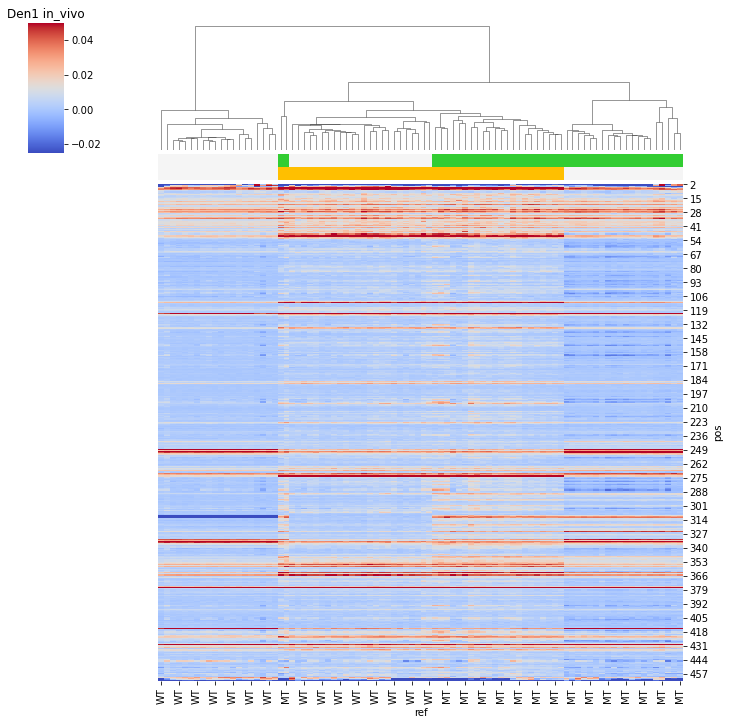

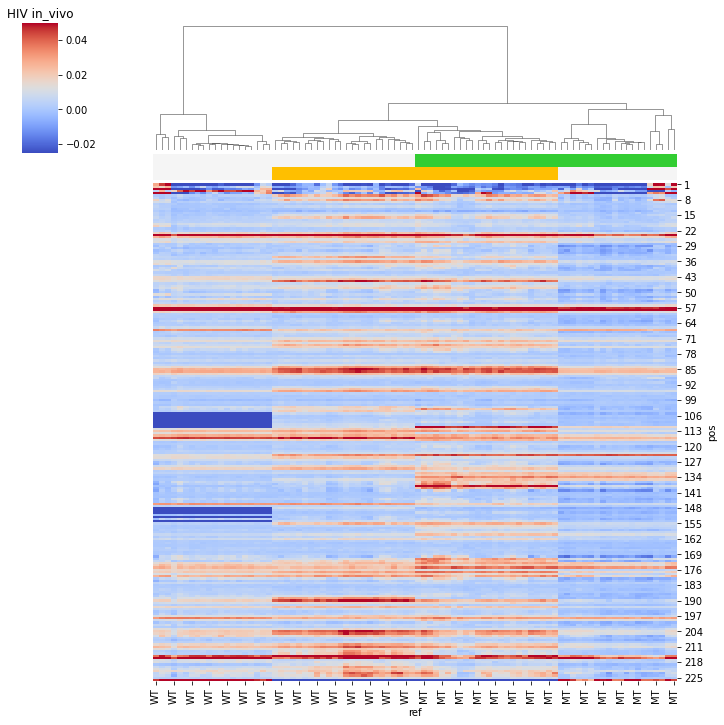

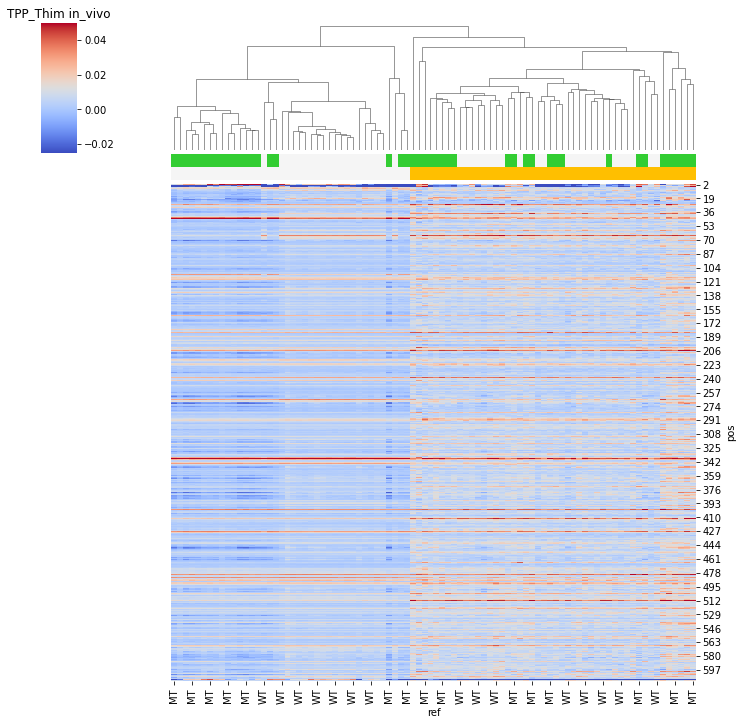

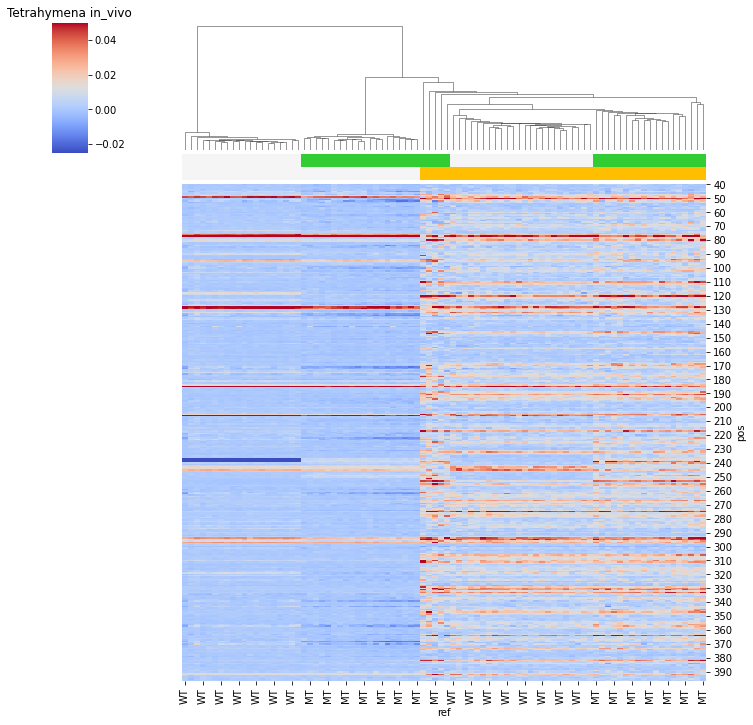

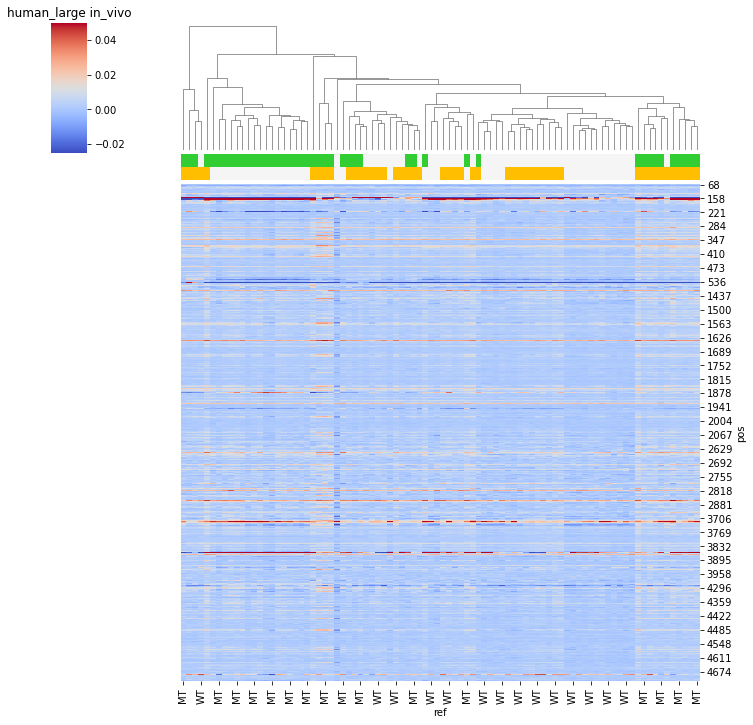

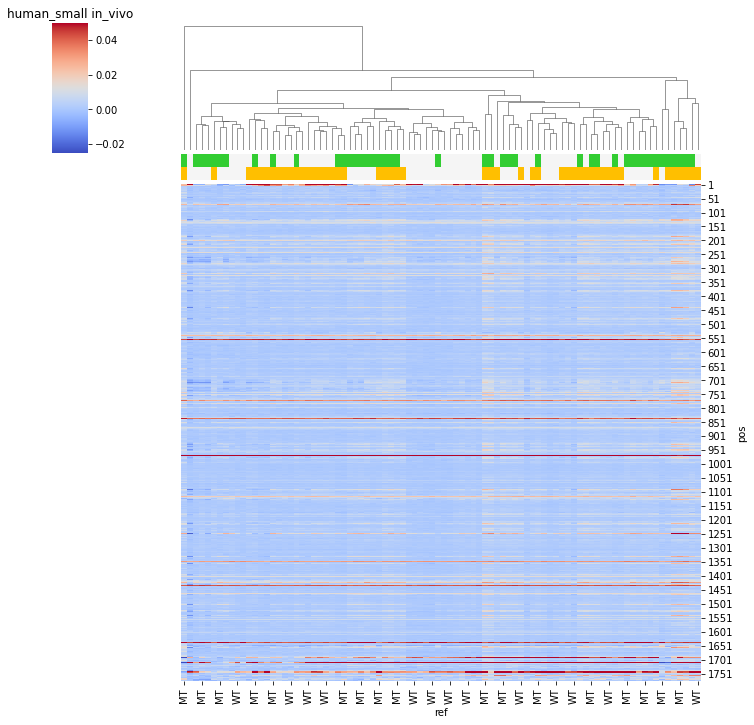

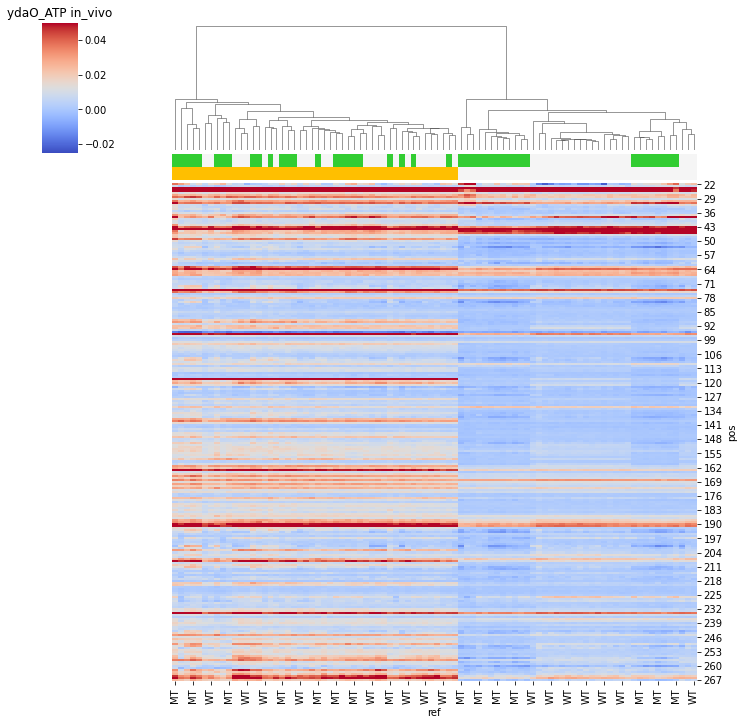

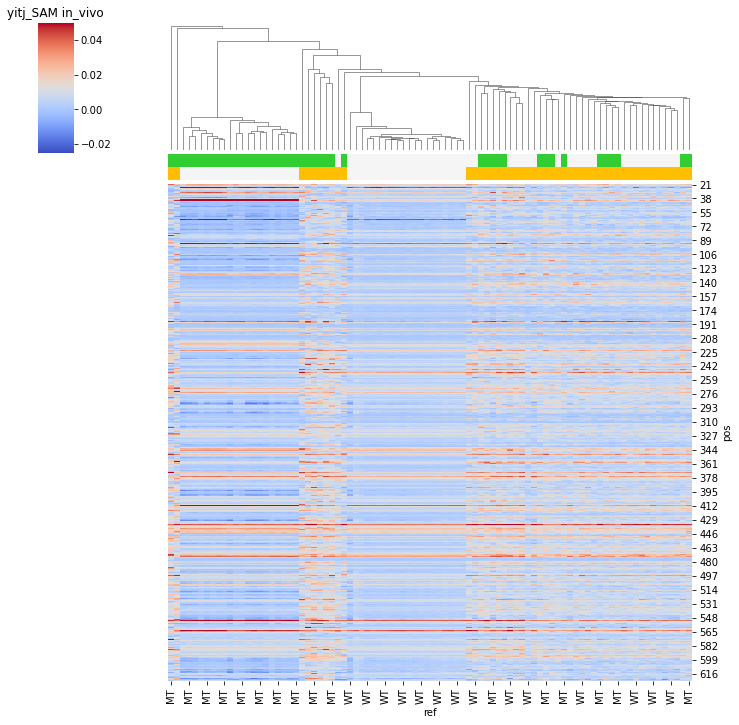

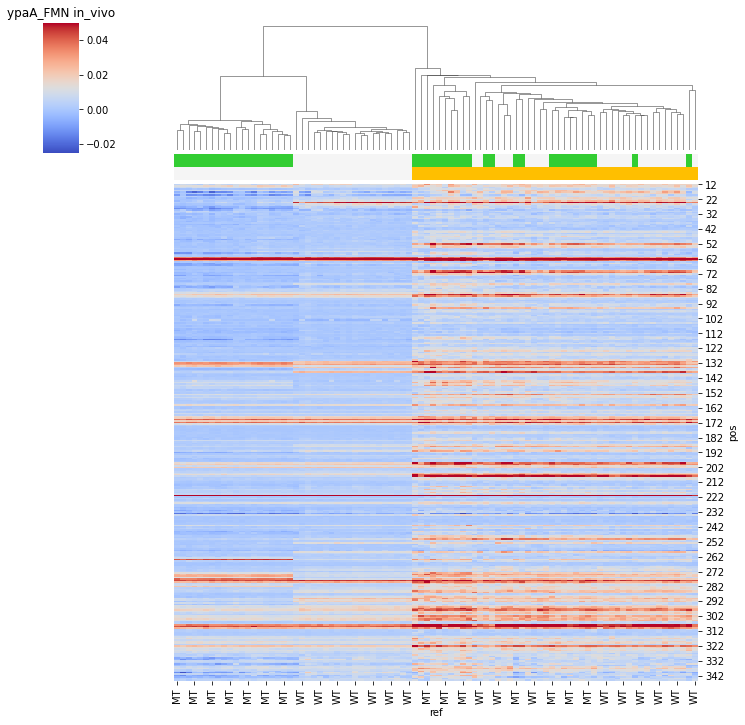

In [91]:
riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]

for gene, gene_subset in riboswitch_reac.dropna(how="all").groupby(level="gene"):
    #print (gene_subset)

    col_df = gene_subset.columns.to_frame()
    col_df.index = list(range(col_df.index.size))
    #print (col_df)
    labels = col_df['ref']
    flatui = ["#F5F5F5", "#32CD32"]
    lut = dict(zip(["WT","MT"], sns.color_palette(flatui)))
    col_ref_colors = labels.map(lut)
    col_ref_colors
    
    labels = col_df['transfer']
    flatui = ["#F5F5F5", "#FFBF00"]
    lut = dict(zip(["in_vitro","in_vivo"], sns.color_palette(flatui)))
    col_transfer_colors = labels.map(lut)
    col_transfer_colors

    plot_reac = gene_subset.dropna()
    plot_reac.index = plot_reac.index.get_level_values('pos')
    plot_reac.columns = plot_reac.columns.get_level_values('ref')
    sns.clustermap(data=plot_reac, row_cluster=False, cmap="coolwarm", vmin=-0.025, vmax=0.05,
                   col_colors=[col_ref_colors, col_transfer_colors],colors_ratio=(0.01,0.02))
    plt.title("{} {}".format(gene, transfer))
    plt.show()

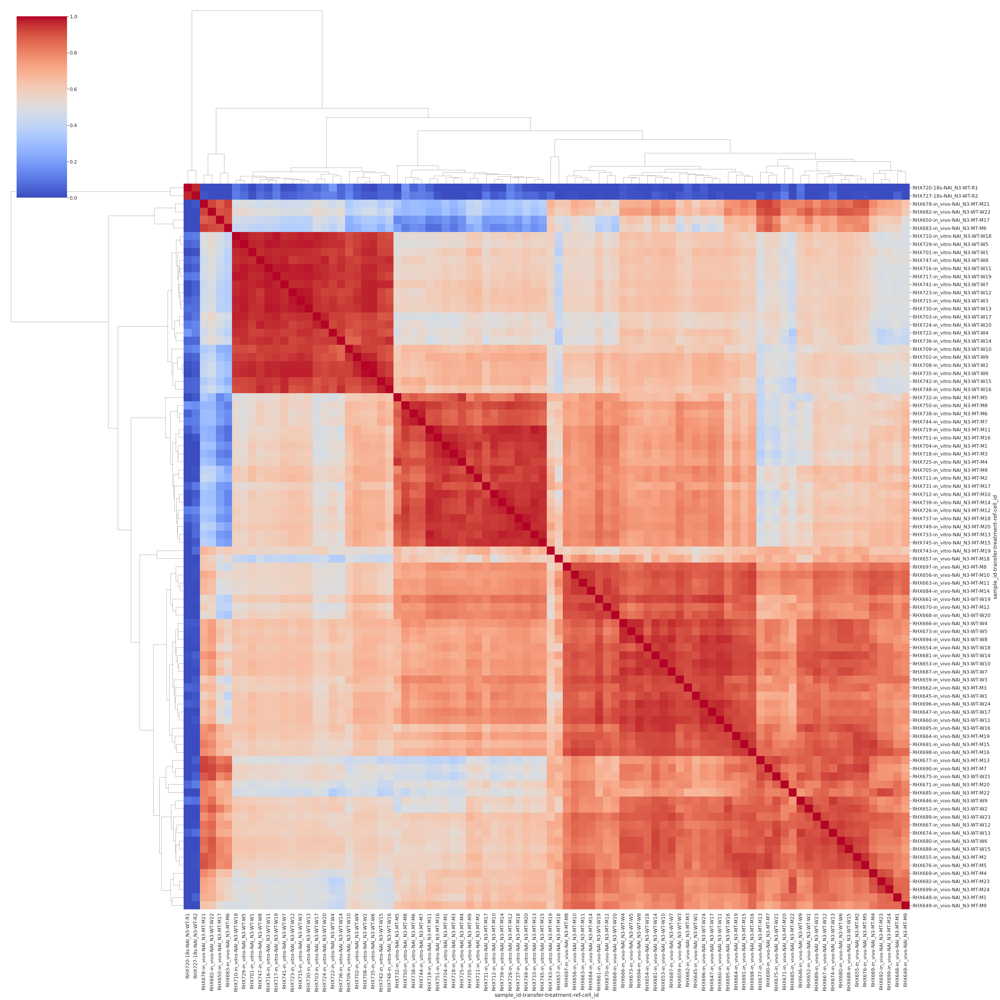

In [184]:
sns.set(font_scale=1.5)
sns.clustermap(reac_df.corr(), cmap="coolwarm", vmax=1, vmin=0, figsize=(48,48), annot=False)
sns.set()
plt.show()

### 1.4 accuracy of 18S rRNA in-vitro

In [7]:
#with open("/home/users/astar/gis/zhangyu2/scratch/Projects/Genome_Reference/hg19_rrna/human_18S.dot") as f:
with open("/home/users/astar/gis/zhangyu2/scratch/Projects/Genome_Reference/hg19_rrna/rRNA_solvent_accessibility/human_18S.dot") as f:
    for l in f:
        if l[0] == ">":
            name = l[1:].strip("\n")
        elif l[0] in ['A','T','C','G','U']:
            seq = list(l.strip("\n"))
        elif l[0] in ['.','(',')',"<",">"]:
            dotbrackets = list(l.strip("\n"))
hg_rRNA_dotbrackets_df = pd.DataFrame([seq, dotbrackets]).T
hg_rRNA_dotbrackets_df.columns = ['seq','dotbracket']
print (hg_rRNA_dotbrackets_df.iloc[18:21])
hg_rRNA_dotbrackets_df['Nucleotide'] = list(range(1, hg_rRNA_dotbrackets_df.index.size+1))
hg_rRNA_dotbrackets_df['unpair'] = 0
hg_rRNA_dotbrackets_df.loc[hg_rRNA_dotbrackets_df['dotbracket']==".", 'unpair'] = 1
hg_rRNA_dotbrackets_df = hg_rRNA_dotbrackets_df.set_index('Nucleotide')
hg_rRNA_dotbrackets_df

   seq dotbracket
18   A          )
19   G          )
20   U          .


,seq,dotbracket,unpair
Nucleotide,,,
1,U,.,1
2,A,.,1
3,C,.,1
4,C,(,0
5,U,(,0
...,...,...,...
1866,C,.,1
1867,A,.,1
1868,U,.,1


In [8]:
# roc curve and auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

In [109]:
rRNA_df = reac_df.xs('18s', level="transfer", axis=1, drop_level=False).dropna()
rRNA_df = rRNA_df.loc['human_small']
rRNA_df.columns = ['R1','R2']
rRNA_df = pd.concat([rRNA_df, hg_rRNA_dotbrackets_df], axis=1)

icshape_auc = roc_auc_score(rRNA_df['unpair'].astype("bool").to_list(), rRNA_df['R1'].to_list())
print('scSHAPE in-vitro: ROC AUC=%.3f' % (icshape_auc))
icshape_auc = roc_auc_score(rRNA_df['unpair'].astype("bool").to_list(), rRNA_df['R2'].to_list())
print('scSHAPE in-vitro: ROC AUC=%.3f' % (icshape_auc))
icshape_fpr, icshape_tpr, _ = roc_curve(rRNA_df['unpair'].astype("bool").to_list(), rRNA_df['R2'].to_list())
fig, ax = plt.subplots()
ax.plot(icshape_fpr, icshape_tpr, marker='.', label='Cliff\'s icSHAPE, 18S Mus', linewidth=2, markersize=0, ) #color="blue"

icSHAPE: ROC AUC=0.634


In [113]:
#sns.heatmap(reac_df.xs('18s', level="transfer", axis=1, drop_level=False).dropna(), cmap="coolwarm", vmin=-0.02, vmax=0.05)
reac_df.xs('18s', level="transfer", axis=1, drop_level=False).dropna().corr()

,,,,sample_id,RHX720,RHX727
,,,,transfer,18s,18s
,,,,treatment,NAI_N3,NAI_N3
,,,,ref,WT,WT
,,,,cell_id,R1,R2
sample_id,transfer,treatment,ref,cell_id,,
RHX720,18s,NAI_N3,WT,R1,1.00000,0.96565
RHX727,18s,NAI_N3,WT,R2,0.96565,1.00000


(7522, 88)
(7522, 84)


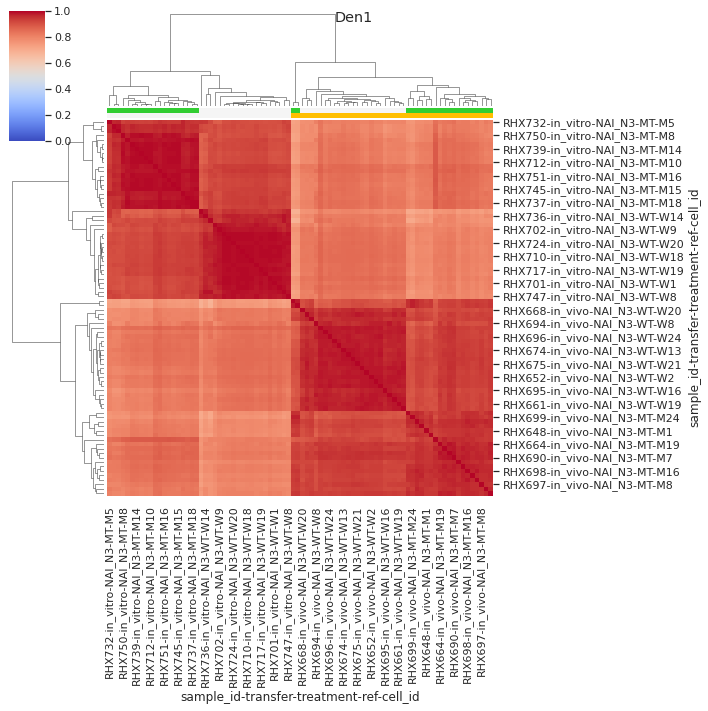

In [186]:
removed_cell_ids = ['RHX678','RHX682','RHX650','RHX683']

riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
#riboswitch_reac = gene_normalization_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0.01, gene_winsorize=True)
riboswitch_reac = winsorize_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)
print (riboswitch_reac.shape)
riboswitch_reac = riboswitch_reac.loc[:, ~riboswitch_reac.columns.get_level_values('sample_id').isin(removed_cell_ids)]
print (riboswitch_reac.shape)


for gene, gene_subset in riboswitch_reac.groupby(level="gene"):
    wide_vitro_reac = gene_subset.xs('in_vitro', level="transfer", drop_level=False, axis=1)
    wide_vivo_reac = gene_subset.xs('in_vivo', level="transfer", drop_level=False, axis=1)
    
    corr_df = gene_subset.corr()
    col_df = corr_df.index.to_frame()
    col_df.index = list(range(col_df.index.size))
    
    labels = col_df['ref']
    flatui = ["#F5F5F5", "#32CD32"]
    lut = dict(zip(["WT","MT"], sns.color_palette(flatui)))
    col_ref_colors = labels.map(lut)
    col_ref_colors
    
    labels = col_df['transfer']
    flatui = ["#F5F5F5", "#FFBF00"]
    lut = dict(zip(["in_vitro","in_vivo"], sns.color_palette(flatui)))
    col_transfer_colors = labels.map(lut)
    col_transfer_colors
    
    g = sns.clustermap(corr_df, cmap="coolwarm", vmin=0, vmax=1, col_colors=[col_ref_colors,col_transfer_colors],colors_ratio=(0.01,0.01))
    g.fig.suptitle(gene)
    plt.show()
    
    
    
    break

### 1.5 accuracy of Tetrahymena

In [22]:
riboswitch_reac

sample_id       RHX704    RHX705    RHX711    RHX712    RHX718    RHX719  \
transfer      in_vitro  in_vitro  in_vitro  in_vitro  in_vitro  in_vitro   
treatment       NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3   
ref                 MT        MT        MT        MT        MT        MT   
cell_id             M1        M9        M2       M10        M3       M11   
gene     pos                                                               
Den1     1   -0.037864 -0.056180 -0.068342 -0.103428 -0.034311 -0.072488   
         2   -0.060269 -0.088567 -0.086984 -0.123338 -0.055240 -0.093356   
         3   -0.005395 -0.031260 -0.012724 -0.053158  0.001523 -0.048684   
         4   -0.010114 -0.012350  0.002716 -0.006607 -0.000837 -0.003349   
         5    0.035343  0.034732  0.020698  0.030428  0.034171  0.022478   
...                ...       ...       ...       ...       ...       ...   
ypaA_FMN 348  0.023772 -0.004336  0.025160  0.017368  0.038151  0.020453   
         349  0.002174  0.007090 -0.003921 -0.000998 -0.004192  0.003549   
         350  0.075066  0.016610  0.089057  0.031386  0.122230  0.023255   
         351 -0.003801 -0.009152  0.006012 -0.006546  0.003061 -0.007952   
         352 -0.003158 -0.006723  0.000281 -0.004813  0.002327 -0.015246   

sample_id       RHX725    RHX726    RHX731    RHX732  ...    RHX675    RHX680  \
transfer      in_vitro  in_vitro  in_vitro  in_vitro  ...   in_vivo   in_vivo   
treatment       NAI_N3    NAI_N3    NAI_N3    NAI_N3  ...    NAI_N3    NAI_N3   
ref                 MT        MT        MT        MT  ...        WT        WT   
cell_id             M4       M12       M17        M5  ...       W21        W6   
gene     pos                                          ...                       
Den1     1    0.016749 -0.066407 -0.090537  0.025995  ... -0.193869 -0.168942   
         2    0.005044 -0.090691 -0.106489  0.077541  ... -0.062333 -0.056682   
         3    0.030856 -0.040692 -0.050107  0.070552  ... -0.016283 -0.002033   
         4   -0.020717 -0.021741 -0.006016 -0.031327  ...  0.015094  0.016529   
         5    0.029093  0.023118  0.029152  0.025987  ...  0.082173  0.082564   
...                ...       ...       ...       ...  ...       ...       ...   
ypaA_FMN 348  0.040112  0.019689  0.007347  0.039074  ... -0.009026 -0.015788   
         349 -0.000822  0.003346  0.004953  0.000529  ...  0.010589  0.004716   
         350  0.125221  0.046485  0.015713  0.111032  ... -0.102872 -0.086869   
         351  0.001364 -0.006716 -0.003569  0.001250  ... -0.020547 -0.032125   
         352  0.001284 -0.002186 -0.006365 -0.001342  ...       NaN       NaN   

sample_id       RHX681    RHX682    RHX687    RHX688    RHX689    RHX694  \
transfer       in_vivo   in_vivo   in_vivo   in_vivo   in_vivo   in_vivo   
treatment       NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3    NAI_N3   
ref                 WT        WT        WT        WT        WT        WT   
cell_id            W14       W22        W7       W15       W23        W8   
gene     pos                                                               
Den1     1   -0.173057 -0.151384 -0.173590 -0.213617 -0.156153 -0.173694   
         2   -0.063918 -0.043907 -0.062126 -0.060507 -0.055092 -0.050170   
         3   -0.009850  0.006125  0.005422  0.002205  0.003638  0.017367   
         4    0.017882  0.025384  0.027015  0.036447  0.018907  0.038364   
         5    0.064888  0.077796  0.069708  0.094430  0.061369  0.077227   
...                ...       ...       ...       ...       ...       ...   
ypaA_FMN 348 -0.017730  0.002353 -0.004690 -0.004015  0.005795  0.022653   
         349 -0.001630  0.007083  0.003912  0.012059  0.008151 -0.000145   
         350 -0.064663 -0.030104 -0.045579 -0.034558 -0.053431  0.011304   
         351 -0.014189 -0.013964 -0.016938 -0.014886 -0.026900 -0.013649   
         352       NaN       NaN       NaN       NaN       NaN       NaN   

sample_id       RHX695    RHX696  
t

## 2. separate cells by riboswitches & ribosniches 

### 2.1 reac changes at each riboswitches

In [15]:
def gene_normalization_1nt(crude_reac, bottom_winsorize=0.0, top_winsorize=0.0, transcriptome_winsorize=False, gene_winsorize=False):
    ## transcriptome-wide winsorization
    crude_reac_array = crude_reac.to_numpy()
    if transcriptome_winsorize:
        crude_reac_array = winsorize(crude_reac_array, limits=[bottom_winsorize, top_winsorize], axis=0, nan_policy="omit")
    winsorized_reac = pd.DataFrame(crude_reac_array, index=crude_reac.index, columns=crude_reac.columns)
    
    concat_genes = []
    for gene, gene_crude_reac in winsorized_reac.groupby(level="gene"):
        ## gene winsorization
        crude_reac_array = gene_crude_reac.to_numpy()
        if gene_winsorize:
            crude_reac_array = winsorize(crude_reac_array, limits=[bottom_winsorize, top_winsorize], axis=0, nan_policy="omit")
        gene_winsorized_reac = pd.DataFrame(crude_reac_array, index=gene_crude_reac.index, columns=gene_crude_reac.columns)
   
        concat_stages = []
        for stage, stage_crude_reac in gene_winsorized_reac.items():
            
            
            iqr = stats.iqr(stage_crude_reac)
            if stage_crude_reac.index.size >= 500:
                pct95_val = np.nanpercentile(stage_crude_reac, 99)
            else:
                pct95_val = np.nanpercentile(stage_crude_reac, 95)
            filter_outlies_series = stage_crude_reac.loc[stage_crude_reac < max(pct95_val, 1.5*iqr)]
            pct90_val_filtered = np.nanpercentile(filter_outlies_series, 90)
            avg_pct90_filtered_vals = filter_outlies_series.loc[filter_outlies_series>pct90_val_filtered].mean()
            normalized_reac = stage_crude_reac/avg_pct90_filtered_vals
            concat_stages.append(normalized_reac)
        gene_norm_reac = pd.concat(concat_stages, axis=1)
        concat_genes.append(gene_norm_reac)
    gene_norm_reac = pd.concat(concat_genes, axis=0)
    gene_norm_reac.columns.names = crude_reac.columns.names
    return gene_norm_reac

def winsorize_1nt(crude_reac, bottom_winsorize=0.0, top_winsorize=0.0, transcriptome_winsorize=False, gene_winsorize=False):
    ## transcriptome-wide winsorization
    crude_reac_array = crude_reac.to_numpy()
    if transcriptome_winsorize:
        crude_reac_array = winsorize(crude_reac_array, limits=[bottom_winsorize, top_winsorize], axis=0, nan_policy="omit")
    winsorized_reac = pd.DataFrame(crude_reac_array, index=crude_reac.index, columns=crude_reac.columns)
    
    if gene_winsorize:
        concat_genes = []
        for gene, gene_crude_reac in crude_reac.groupby(level="gene"):
            ## gene winsorization
            crude_reac_array = gene_crude_reac.to_numpy()
            crude_reac_array = winsorize(crude_reac_array, limits=[bottom_winsorize, top_winsorize], axis=0, nan_policy="omit")
            gene_winsorized_reac = pd.DataFrame(crude_reac_array, index=gene_crude_reac.index, columns=gene_crude_reac.columns)
            concat_genes.append(gene_winsorized_reac)
    winsorized_reac = pd.concat(concat_genes, axis=0)
    winsorized_reac.columns.names = crude_reac.columns.names
    return  winsorized_reac


In [16]:
#bulk_riboswitches_df = load_large_dataFrame("../mux11961/processing/wide_matri/wide_reactivity.merge_ref.matrix.csv", header=[0,1,2,3,4], index_col=[0,1])

bulk_riboswitches_df = load_large_dataFrame("../mux11961/wide_matrix/wide_reactivity.matrix.csv", header=[0,1,2,3,4], index_col=[0,1])
bulk_riboswitches_df = winsorize_1nt(bulk_riboswitches_df, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)
bulk_riboswitches_df = bulk_riboswitches_df.stack([0,1,2,3,4]).to_frame('reac').reset_index()
bulk_riboswitches_df = bulk_riboswitches_df.loc[(bulk_riboswitches_df['rt']=="SSII")&(bulk_riboswitches_df['agent']=='50NAI-N3')]
bulk_riboswitches_df

,gene,pos,sample,id,rt,agent,ref,reac
0,Den1_MT,1,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,0.023965
5,Den1_MT,2,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,-0.024516
10,Den1_MT,3,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,-0.021685
15,Den1_MT,4,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,0.022766
20,Den1_MT,5,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,0.037655
...,...,...,...,...,...,...,...,...
67578,ypaA_FMN,350,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,-0.017518
67587,ypaA_FMN,351,AEX003_SSII_50NAI-N3_WT,AEX003,SSII,50NAI-N3,WT,-0.016361
67588,ypaA_FMN,351,AEX004_SSII_50NAI-N3_MT,AEX004,SSII,50NAI-N3,MT,-0.017518
67597,ypaA_FMN,352,AEX003_SSII_50NAI-N3_WT,AEX003,SSII,50NAI-N3,WT,-0.000870


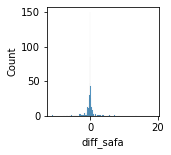

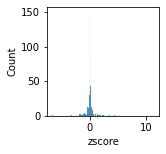

ref                 MT        WT  diff_safa    zscore   sig      y
gene     pos                                                      
FTL6     18   3.599615  1.445782   2.153833  1.311685  True -0.015
         19   0.029973  1.010693  -0.980720 -0.576204   NaN    NaN
         20   0.034862  0.000009   0.034854  0.035459   NaN    NaN
         21   0.021517  0.067182  -0.045665 -0.013036   NaN    NaN
         22   0.004368  0.037716  -0.033348 -0.005618   NaN    NaN
...                ...       ...        ...       ...   ...    ...
ypaA_FMN 142  0.402000  0.534000  -0.132000 -0.065034   NaN    NaN
         143  0.872000  0.773000   0.099000  0.074093   NaN    NaN
         144  1.220000  1.050000   0.170000  0.116856   NaN    NaN
         145  1.790000  1.450000   0.340000  0.219244   NaN    NaN
         146  7.450000  2.070000   5.380000  3.254753  True -0.015

[666 rows x 6 columns]

In [17]:
safa_df = load_large_dataFrame("SAFA quantification_8 ribosXitches.txt", index_col=[0,1], sep="\t") #
safa_df.columns.name = "ref"
safa_df = safa_df.stack().to_frame('reac').reset_index()
safa_df.loc[safa_df['gene']=='Tetraymena','gene'] = 'Tetrahymena'
#print (safa_df.sort_index())
#print (safa_df[['gene','pos']].value_counts().sort_index())

wide_safa = safa_df.pivot(index=['gene','pos'], columns=['ref'], values='reac')
wide_safa['diff_safa'] = wide_safa['MT'] - wide_safa['WT']
wide_safa['zscore'] = stats.zscore(wide_safa['diff_safa'])
#print(wide_safa)
fig, ax = plt.subplots(1,1,figsize=(2,2))
sns.histplot(wide_safa['diff_safa'], ax=ax)
plt.show()
fig, ax = plt.subplots(1,1,figsize=(2,2))
sns.histplot(wide_safa['zscore'], ax=ax)
plt.show()
#safa_mean = wide_safa['zscore'].mean()
#safa_std = wide_safa['zscore'].std()
#print (safa_mean-safa_std, safa_mean+safa_std)
wide_safa['sig'] = np.nan
wide_safa['y'] = np.nan
wide_safa.loc[wide_safa['zscore']<-1, 'sig'] = True
wide_safa.loc[wide_safa['zscore']<-1, 'y'] = -0.015
wide_safa.loc[wide_safa['zscore']>1, 'sig'] = True
wide_safa.loc[wide_safa['zscore']>1, 'y'] = -0.015
wide_safa

In [187]:
riboswitch_reac_vivo = riboswitch_reac.xs('in_vivo', level="transfer", axis=1)
riboswitch_reac_vitro = riboswitch_reac.xs('in_vitro', level="transfer", axis=1)

def mannwhitneyu_for_each_row(row):
    mt_reac = row.xs('MT', level='ref')
    wt_reac = row.xs('WT', level='ref') 
    s,p = stats.mannwhitneyu(mt_reac, wt_reac)
    #s,p = stats.ttest_ind(mt_reac, wt_reac)
    fold = np.abs(mt_reac.mean())/np.abs(wt_reac.mean())
    diffreac = mt_reac.mean() - wt_reac.mean()
    return [p, fold, diffreac]
test_vivo = riboswitch_reac_vivo.apply(mannwhitneyu_for_each_row, axis=1, result_type="expand").dropna()
test_vitro = riboswitch_reac_vitro.apply(mannwhitneyu_for_each_row, axis=1, result_type="expand").dropna()
test_vivo.columns = ['pval', 'foldchange','diffreac']
test_vitro.columns = ['pval', 'foldchange','diffreac']

print (test_vivo)
res_fdr = multipletests(test_vivo['pval'], method="fdr_bh")
test_vivo['fdr'] =res_fdr[1]
res_fdr = multipletests(test_vitro['pval'], method="fdr_bh")
test_vitro['fdr'] =res_fdr[1]

test_vivo['y'] = np.nan
#test_vivo.loc[(test_vivo['fdr']<0.01)&(test_vivo['foldchange']>=2), 'y'] = 0.095
test_vivo.loc[(test_vivo['fdr']<0.01)&(test_vivo['diffreac']>=0.01)&(test_vivo['foldchange']>=2), 'y'] = -0.01
test_vitro['y'] = np.nan
#test_vitro.loc[(test_vitro['fdr']<0.01)&(test_vitro['foldchange']>=2), 'y'] = 0.095
test_vitro.loc[(test_vitro['fdr']<0.01)&(test_vitro['diffreac']>=0.01)&(test_vivo['foldchange']>=2), 'y'] = -0.01

                      pval  foldchange  diffreac
gene     pos                                    
Den1     2    4.661336e-02    5.653320  0.000391
         3    6.575325e-01    1.335287  0.000894
         4    1.376770e-07    0.280741 -0.019130
         5    8.285931e-01    0.992148 -0.000597
         6    3.481446e-01    0.953964 -0.003383
...                    ...         ...       ...
ypaA_FMN 341  1.835290e-01    0.762353 -0.001671
         342  6.134314e-01    1.210752  0.001937
         343  2.611102e-01    1.517074  0.002054
         344  7.028593e-01    0.931998 -0.000555
         345  2.440148e-01    1.088070  0.000616

[6884 rows x 3 columns]


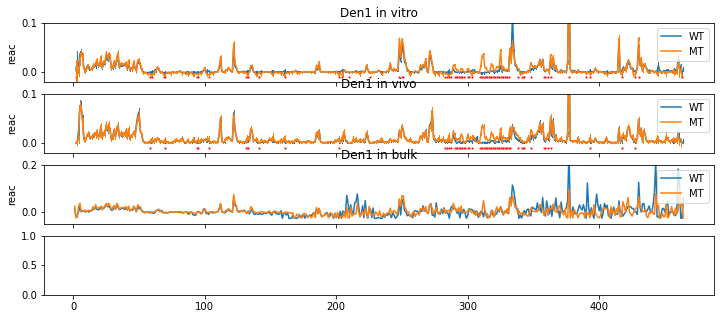

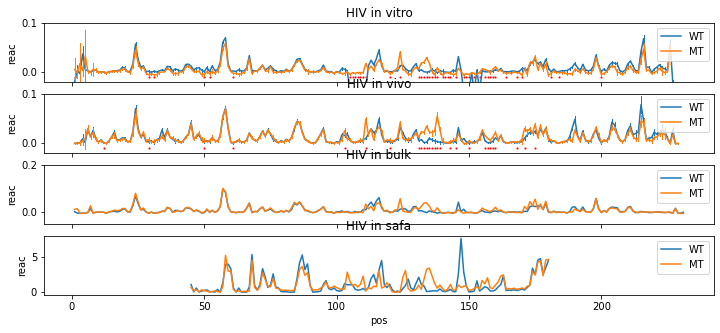

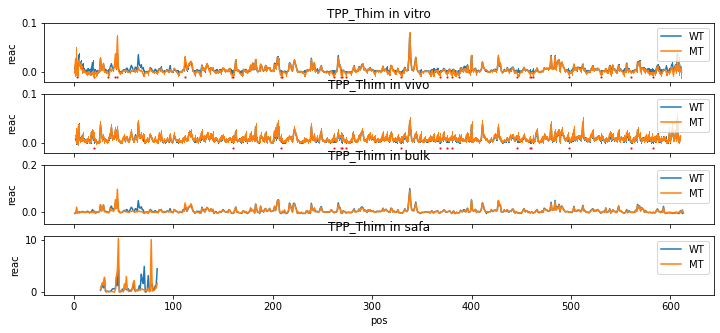

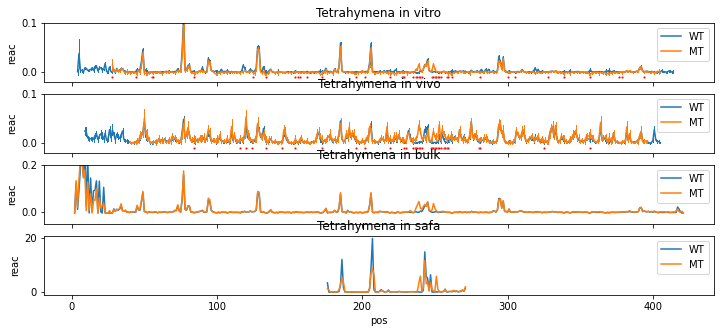

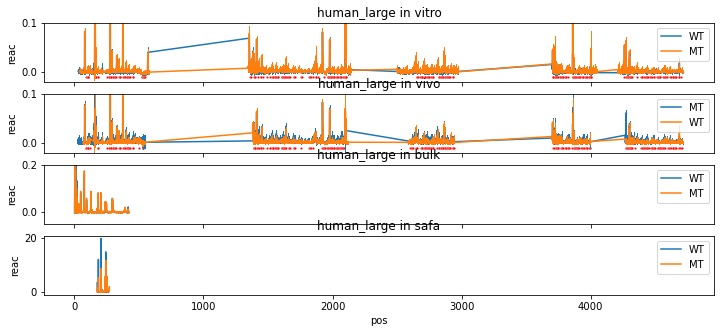

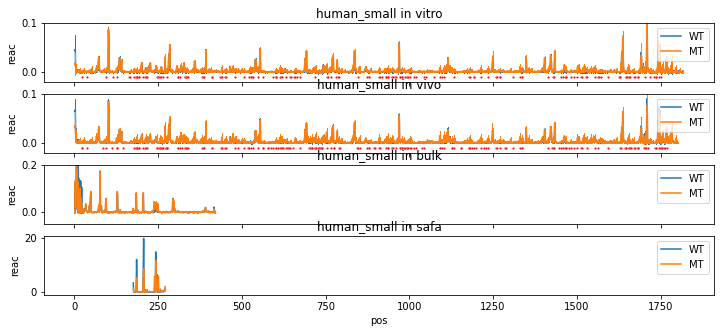

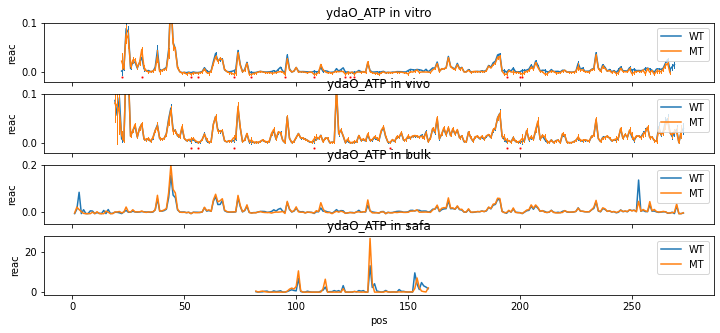

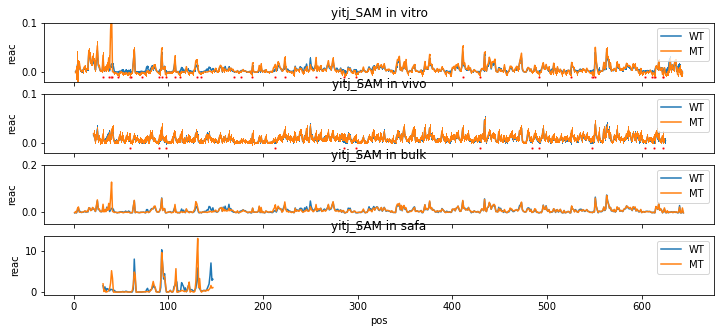

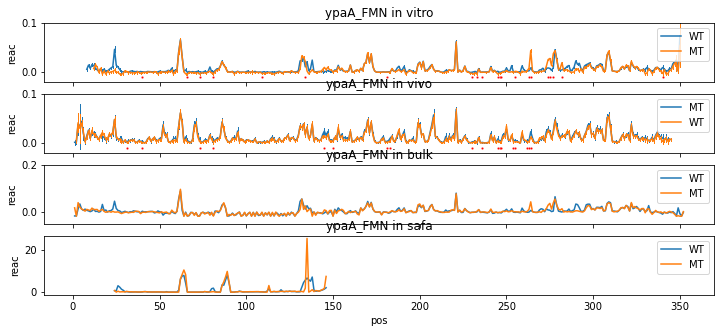

In [19]:
removed_cell_ids = ['']

riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
#riboswitch_reac = gene_normalization_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0.01, gene_winsorize=True)
riboswitch_reac = winsorize_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)

## sig differences of shape-map
riboswitch_reac_vivo = riboswitch_reac.xs('in_vivo', level="transfer", axis=1)
riboswitch_reac_vitro = riboswitch_reac.xs('in_vitro', level="transfer", axis=1)
def mannwhitneyu_for_each_row(row):
    mt_reac = row.xs('MT', level='ref')
    wt_reac = row.xs('WT', level='ref') 
    s,p = stats.mannwhitneyu(mt_reac, wt_reac)
    #s,p = stats.ttest_ind(mt_reac, wt_reac)
    fold = np.abs(mt_reac.mean())/np.abs(wt_reac.mean())
    diffreac = mt_reac.mean() - wt_reac.mean()
    return [p, fold, diffreac]
test_vivo = riboswitch_reac_vivo.apply(mannwhitneyu_for_each_row, axis=1, result_type="expand").dropna()
test_vitro = riboswitch_reac_vitro.apply(mannwhitneyu_for_each_row, axis=1, result_type="expand").dropna()
test_vivo.columns = ['pval', 'foldchange','diffreac']
test_vitro.columns = ['pval', 'foldchange','diffreac']

res_fdr = multipletests(test_vivo['pval'], method="fdr_bh")
test_vivo['fdr'] =res_fdr[1]
res_fdr = multipletests(test_vitro['pval'], method="fdr_bh")
test_vitro['fdr'] =res_fdr[1]

test_vivo['y'] = np.nan
#test_vivo.loc[(test_vivo['fdr']<0.01)&(test_vivo['foldchange']>=2), 'y'] = 0.095
test_vivo.loc[(test_vivo['fdr']<0.01)&((test_vivo['diffreac']>=0.01)|(test_vivo['foldchange']>=2)), 'y'] = -0.01
test_vitro['y'] = np.nan
#test_vitro.loc[(test_vitro['fdr']<0.01)&(test_vitro['foldchange']>=2), 'y'] = 0.095
test_vitro.loc[(test_vitro['fdr']<0.01)&((test_vitro['diffreac']>=0.01)|(test_vivo['foldchange']>=2)), 'y'] = -0.01


### plot curve
for gene, gene_subset in riboswitch_reac.groupby(level="gene"):
    wide_vitro_reac = gene_subset.xs('in_vitro', level="transfer", drop_level=False, axis=1)
    wide_vivo_reac = gene_subset.xs('in_vivo', level="transfer", drop_level=False, axis=1)
    
    vitro_reac = wide_vitro_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
    vivo_reac = wide_vivo_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
    if gene not in ['human_small','human_large']:
        bulk_reac = bulk_riboswitches_df.loc[bulk_riboswitches_df['gene']==gene]
        safa_reac = safa_df.loc[safa_df['gene']==gene]
        
    sig_gene_vivo = test_vivo.loc[test_vivo.index.get_level_values('gene')==gene].dropna().reset_index()
    sig_gene_vitro = test_vitro.loc[test_vitro.index.get_level_values('gene')==gene].dropna().reset_index()
    #sig_gene_safa = 
    #print (sig_gene_vivo)
        
    fig, axs = plt.subplots(4,1,figsize=(12,5), sharex=True, sharey=False)
    sns.lineplot(data=vitro_reac, x="pos", y="reac", hue="ref", ax=axs[0],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.lineplot(data=vivo_reac, x="pos", y="reac", hue="ref", ax=axs[1],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.lineplot(data=bulk_reac, x="pos", y="reac", hue="ref", ax=axs[2],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.lineplot(data=safa_reac, x="pos", y="reac", hue="ref", ax=axs[3],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    
    sns.scatterplot(data=sig_gene_vitro, x="pos", y="y", color='red', ax=axs[0], s=5)
    sns.scatterplot(data=sig_gene_vivo, x="pos", y="y", color='red', ax=axs[1], s=5)
    
    
    axs[0].set_ylim(-0.02, 0.1)
    axs[1].set_ylim(-0.02, 0.1)
    axs[2].set_ylim(-0.05, 0.2)
    
    
    #axs[1].set_ylim(-0.5, 4.5)
    
    axs[0].set_title("{} in vitro".format(gene))
    axs[1].set_title("{} in vivo".format(gene))
    axs[2].set_title("{} in bulk".format(gene))
    
    axs[0].legend(loc='upper right')
    axs[1].legend(loc='upper right')
    axs[2].legend(loc='upper right')
    
    if safa_reac.index.size > 0:
        axs[3].set_title("{} in safa".format(gene))
        axs[3].legend(loc='upper right')

    if gene in ['Den1','HIV','Tetrahymena']:
        #plt.savefig("Figures/Fig_x3.lineplot_of_integrated_reac/{}.shape_reac.lineplot.pdf".format(gene))
        pass
    plt.show()
    

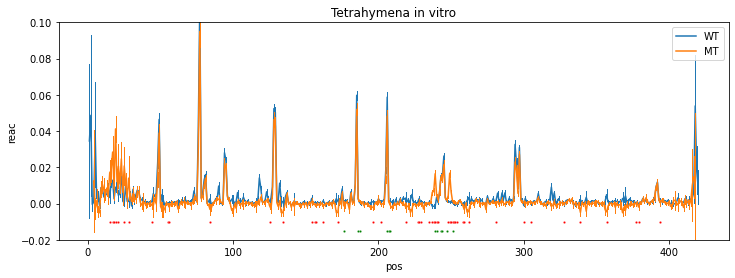

In [69]:
removed_cell_ids = ['']

riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
#riboswitch_reac = gene_normalization_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0.01, gene_winsorize=True)
riboswitch_reac = winsorize_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)

## sig differences of shape-map
riboswitch_reac_vivo = riboswitch_reac.xs('in_vivo', level="transfer", axis=1)
riboswitch_reac_vitro = riboswitch_reac.xs('in_vitro', level="transfer", axis=1)
def mannwhitneyu_for_each_row(row):
    mt_reac = row.xs('MT', level='ref')
    wt_reac = row.xs('WT', level='ref') 
    s,p = stats.mannwhitneyu(mt_reac, wt_reac)
    #s,p = stats.ttest_ind(mt_reac, wt_reac)
    fold = np.abs(mt_reac.mean())/np.abs(wt_reac.mean())
    diffreac = mt_reac.mean() - wt_reac.mean()
    return [p, fold, diffreac]
test_vivo = riboswitch_reac_vivo.apply(mannwhitneyu_for_each_row, axis=1, result_type="expand").dropna()
test_vitro = riboswitch_reac_vitro.apply(mannwhitneyu_for_each_row, axis=1, result_type="expand").dropna()
test_vivo.columns = ['pval', 'foldchange','diffreac']
test_vitro.columns = ['pval', 'foldchange','diffreac']

res_fdr = multipletests(test_vivo['pval'], method="fdr_bh")
test_vivo['fdr'] =res_fdr[1]
res_fdr = multipletests(test_vitro['pval'], method="fdr_bh")
test_vitro['fdr'] =res_fdr[1]

test_vivo['y'] = np.nan
#test_vivo.loc[(test_vivo['fdr']<0.01)&(test_vivo['foldchange']>=2), 'y'] = 0.095
test_vivo.loc[(test_vivo['fdr']<0.01)&((test_vivo['diffreac']>=0.01)|(test_vivo['foldchange']>=2)), 'y'] = -0.01
test_vitro['y'] = np.nan
#test_vitro.loc[(test_vitro['fdr']<0.01)&(test_vitro['foldchange']>=2), 'y'] = 0.095
test_vitro.loc[(test_vitro['fdr']<0.01)&((test_vitro['diffreac']>=0.01)|(test_vivo['foldchange']>=2)), 'y'] = -0.01


### plot curve
for gene, gene_subset in riboswitch_reac.groupby(level="gene"):
    if gene != "Tetrahymena":
        continue
    wide_vitro_reac = gene_subset.xs('in_vitro', level="transfer", drop_level=False, axis=1)
    wide_vivo_reac = gene_subset.xs('in_vivo', level="transfer", drop_level=False, axis=1)
    
    vitro_reac = wide_vitro_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
    vivo_reac = wide_vivo_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
    if gene not in ['human_small','human_large']:
        bulk_reac = bulk_riboswitches_df.loc[bulk_riboswitches_df['gene']==gene]
        safa_reac = safa_df.loc[safa_df['gene']==gene]
        
    sig_gene_vivo = test_vivo.loc[test_vivo.index.get_level_values('gene')==gene].dropna().reset_index()
    sig_gene_vitro = test_vitro.loc[test_vitro.index.get_level_values('gene')==gene].dropna().reset_index()
    sig_gene_safa = wide_safa.loc[wide_safa.index.get_level_values('gene')==gene].dropna().reset_index()
    #print (sig_gene_vivo)
        
    fig, ax = plt.subplots(1,1,figsize=(12,4), sharex=True, sharey=False)
    sns.lineplot(data=vitro_reac, x="pos", y="reac", hue="ref", ax=ax,  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.scatterplot(data=sig_gene_vitro, x="pos", y="y", color='red', ax=ax, s=5)
    sns.scatterplot(data=sig_gene_safa, x="pos", y="y", color='green', ax=ax, s=5)
    

    ax.set_ylim(-0.02, 0.1)
    ax.set_title("{} in vitro".format(gene))
    ax.legend(loc='upper right')
    #plt.savefig("Figures/Fig_x2.lineplot_with_different_areas/{}.shape_reac.lineplot.pdf".format(gene))
    plt.show()

In [10]:
removed_cell_ids = ['RHX649']

riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
#riboswitch_reac = gene_normalization_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0.01, gene_winsorize=True)
riboswitch_reac = winsorize_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)
print (riboswitch_reac.shape)
riboswitch_reac = riboswitch_reac.loc[:, ~riboswitch_reac.columns.get_level_values('sample_id').isin(removed_cell_ids)]
print (riboswitch_reac.shape)

(8253, 88)
(8253, 87)


[0.29316677 0.08566292 0.06890717 0.05118702 0.05037601 0.03726428
 0.02524391 0.02324015 0.02026507 0.01906541]


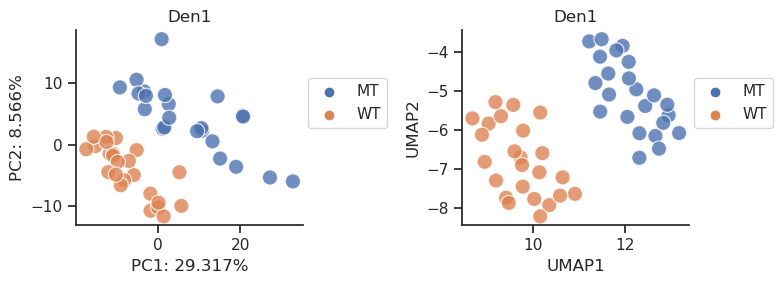

[0.29971053 0.23704485 0.10989122 0.04966871 0.03616223 0.02787304
 0.0246699  0.01507429 0.0132148  0.01297764]


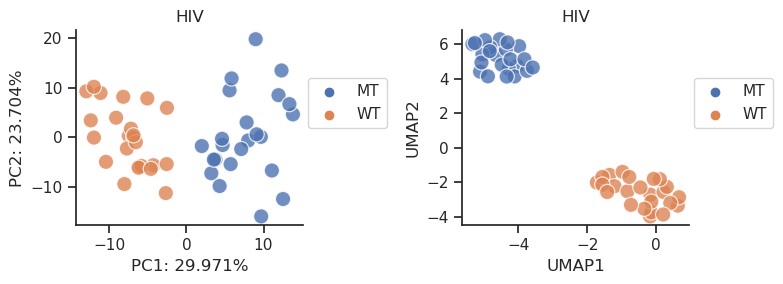

[0.19563341 0.0725085  0.06327757 0.0434848  0.03848315 0.03676548
 0.03069119 0.02578126 0.02553842 0.02433654]


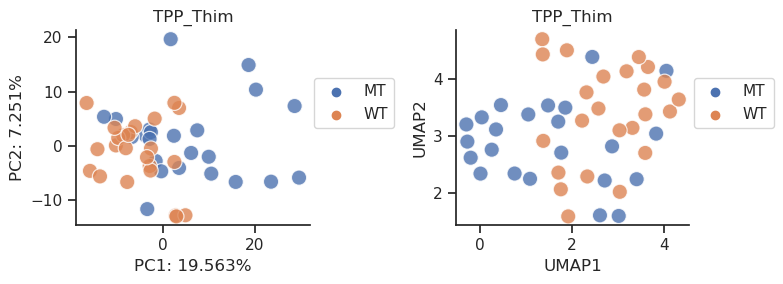

[0.15646281 0.06476538 0.05770551 0.04901019 0.04528329 0.03683757
 0.03277272 0.0312232  0.02962364 0.02869295]


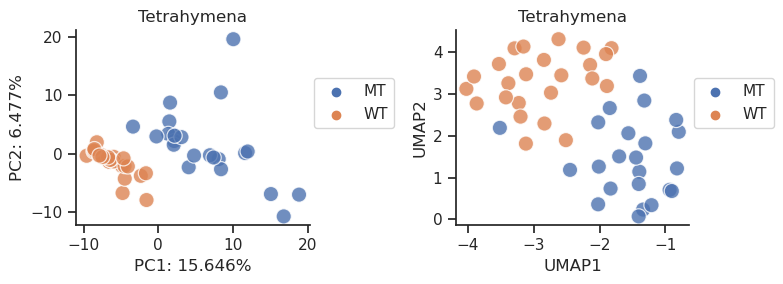

[0.31812094 0.11632092 0.06537009 0.03967803 0.03351407 0.02536884
 0.01873118 0.01778897 0.01667083 0.01578995]


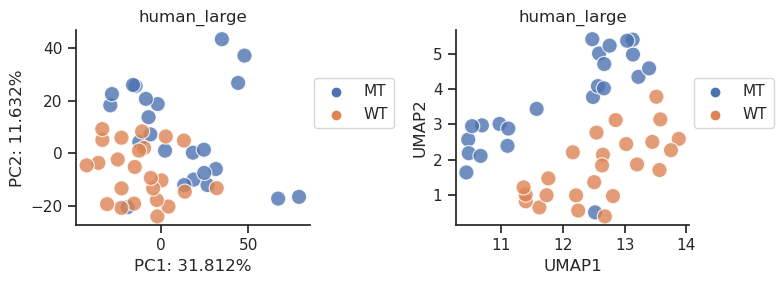

[0.45243465 0.1464995  0.0479909  0.03438496 0.02861064 0.02651386
 0.01783319 0.01345524 0.01166825 0.01146546]


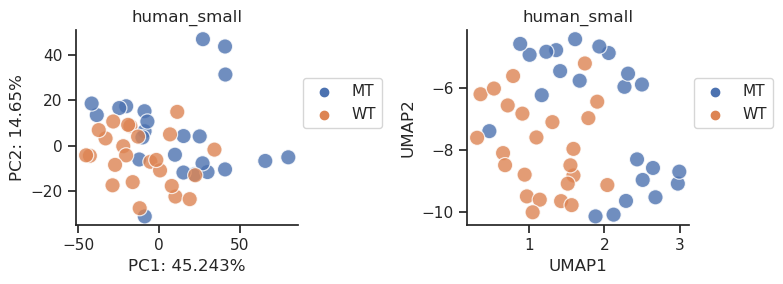

[0.32171634 0.15833058 0.0633428  0.05163984 0.04115168 0.03936817
 0.02720668 0.0180905  0.01730922 0.01615862]


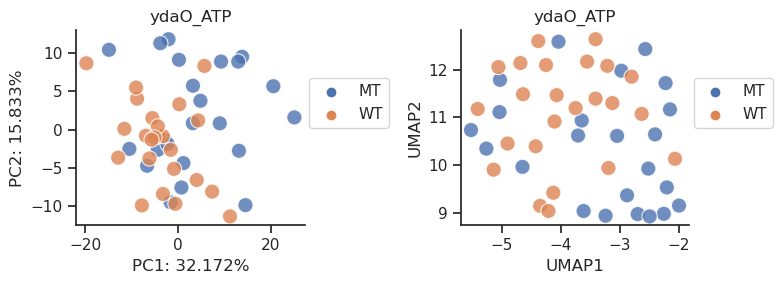

[0.1467162  0.08016371 0.06436964 0.05675303 0.04061597 0.03551889
 0.03161757 0.03094845 0.02800108 0.02483142]


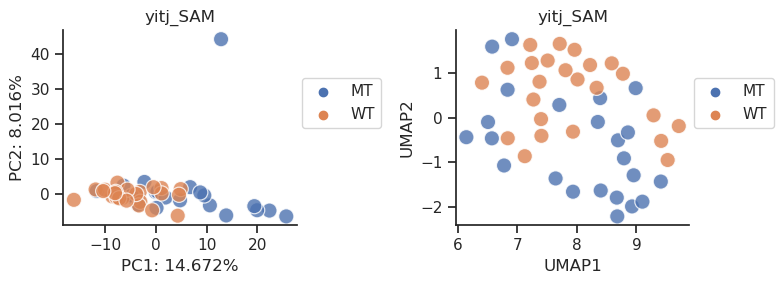

[0.22935641 0.07336213 0.0571046  0.05085283 0.04568413 0.0383838
 0.03291574 0.02951697 0.02546909 0.02365842]


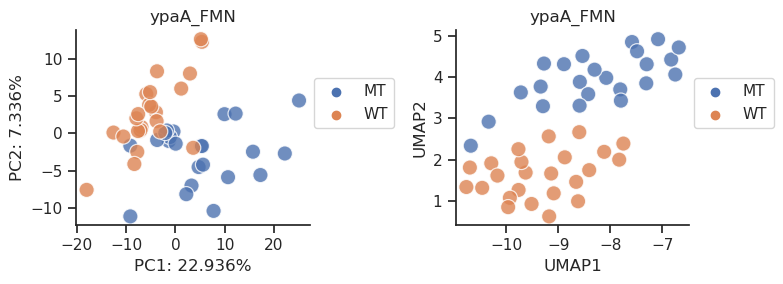

In [81]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.colors as mcolors

for gene, gene_subset in riboswitch_reac.groupby(level="gene"):
    #wide_vivo_reac = gene_subset.xs('in_vitro', level="transfer", drop_level=False, axis=1)
    wide_vivo_reac = gene_subset.xs('in_vivo', level="transfer", drop_level=False, axis=1)
    wide_vivo_reac = wide_vivo_reac.dropna().T
    
    
    local_diffreac_df_array = wide_vivo_reac.to_numpy()
    scaler = StandardScaler()
    scaler.fit(local_diffreac_df_array)
    scaler.transform(local_diffreac_df_array)
    scaled_local_diffreac_df = pd.DataFrame(scaler.transform(local_diffreac_df_array), index=wide_vivo_reac.index, columns=wide_vivo_reac.columns)
    
    pca = PCA(n_components=10)
    pca.fit(scaled_local_diffreac_df)
    reac_pca = pca.transform(scaled_local_diffreac_df)
    reac_pca = pd.DataFrame(reac_pca, index=scaled_local_diffreac_df.index, columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10'])
    print(pca.explained_variance_ratio_)
    #Import required module
    from sklearn.cluster import KMeans
    #Initialize the class object
    kmeans = KMeans(n_clusters= 2)
    #predict the labels of clusters.
    #label = kmeans.fit_predict(local_res_pca.set_index(['subtype','ca_sample']))
    label = kmeans.fit_predict(scaled_local_diffreac_df)
    local_res_pca = reac_pca.reset_index()
    local_res_pca['cluster'] = label
    #print (local_res_pca)
    
    
    reducer = umap.UMAP(n_components=2)
    x = reducer.fit_transform(scaled_local_diffreac_df)
    gene_umap_df = pd.DataFrame(x, index = scaled_local_diffreac_df.index)
    gene_umap_df.columns = ['UMAP1','UMAP2']
    gene_umap_df = gene_umap_df.reset_index()
    
    custom_params = {"axes.spines.right": False, "axes.spines.top": False}
    sns.set_theme(style="ticks", rc=custom_params)
    fig, axs = plt.subplots(1,2, figsize=(8,3))
    plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.2)
    ax = axs[0]
    sns.scatterplot(data=local_res_pca, x="PC1", y="PC2", hue="ref", ax=ax, s=120, alpha=0.8) #hue="cell_type",
    ax.set_xlabel("PC1: {}%".format(np.round(pca.explained_variance_ratio_[0]*100, 3)))
    ax.set_ylabel("PC2: {}%".format(np.round(pca.explained_variance_ratio_[1]*100, 3)))
    ax.set_title(gene)
    ax.legend(loc=[1.02,0.5])
    
    ax = axs[1]
    sns.scatterplot(data=gene_umap_df, x="UMAP1", y="UMAP2", hue="ref", ax=ax, s=120, alpha=0.8) #hue="cell_type",
    ax.set_xlabel("UMAP1")
    ax.set_ylabel("UMAP2")
    ax.set_title(gene)
    ax.legend(loc=[1.02,0.5])
    
    #texts = []
    #for _, row in local_res_pca.iterrows():
    #    #print (row)
    #    X=row["PC1"]
    #    Y=row['PC2']
    #    name = row['sample_id']
    #    texts.append(ax.text(X, Y, name, size=8, color='black', horizontalalignment="center" , verticalalignment="bottom", snap=True))
    #iteration_num = adjust_text(texts, arrowprops=dict(arrowstyle="-", color='grey', lw=0.5),autoalign=True, ax=ax)
    plt.tight_layout()
    #plt.savefig("Figures/Fig_x1.scatterplot_of_cell_clustering_by_ribosnitches/{}.in_vivo.pdf".format(gene))
    plt.show()
    #sns.reset_defaults()
    #break

[0.22662237 0.10936167 0.06258291 0.04569009 0.04084065 0.03839178
 0.02631438 0.02538552 0.02425286 0.02142937]


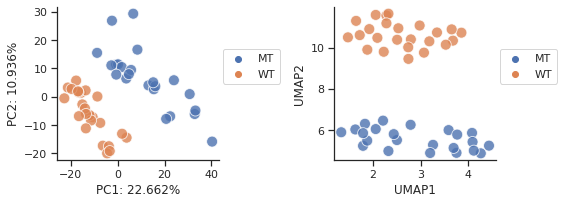

In [18]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.colors as mcolors

wide_vivo_reac = riboswitch_reac.xs('in_vivo', level="transfer", drop_level=False, axis=1)
wide_vivo_reac = wide_vivo_reac.loc[wide_vivo_reac.index.get_level_values('gene').isin(['Den1','HIV','Tetrahymena'])]
wide_vivo_reac = wide_vivo_reac.dropna().T
wide_vivo_reac

local_diffreac_df_array = wide_vivo_reac.to_numpy()
scaler = StandardScaler()
scaler.fit(local_diffreac_df_array)
scaler.transform(local_diffreac_df_array)
scaled_local_diffreac_df = pd.DataFrame(scaler.transform(local_diffreac_df_array), index=wide_vivo_reac.index, columns=wide_vivo_reac.columns)

pca = PCA(n_components=10)
pca.fit(scaled_local_diffreac_df)
reac_pca = pca.transform(scaled_local_diffreac_df)
reac_pca = pd.DataFrame(reac_pca, index=scaled_local_diffreac_df.index, columns=['PC1','PC2','PC3','PC4','PC5','PC6','PC7','PC8','PC9','PC10'])
print(pca.explained_variance_ratio_)
local_res_pca = reac_pca.reset_index()

reducer = umap.UMAP(n_components=2)
x = reducer.fit_transform(scaled_local_diffreac_df)
gene_umap_df = pd.DataFrame(x, index = scaled_local_diffreac_df.index)
gene_umap_df.columns = ['UMAP1','UMAP2']
gene_umap_df = gene_umap_df.reset_index()

custom_params = {"axes.spines.right": False, "axes.spines.top": False}
sns.set_theme(style="ticks", rc=custom_params)
fig, axs = plt.subplots(1,2, figsize=(8,3))
plt.subplots_adjust(left=0.1, right=0.8, top=0.9, bottom=0.2)
ax = axs[0]
sns.scatterplot(data=local_res_pca, x="PC1", y="PC2", hue="ref", ax=ax, s=120, alpha=0.8) #hue="cell_type",
ax.set_xlabel("PC1: {}%".format(np.round(pca.explained_variance_ratio_[0]*100, 3)))
ax.set_ylabel("PC2: {}%".format(np.round(pca.explained_variance_ratio_[1]*100, 3)))
#ax.set_title(gene)
ax.legend(loc=[1.02,0.5])

ax = axs[1]
sns.scatterplot(data=gene_umap_df, x="UMAP1", y="UMAP2", hue="ref", ax=ax, s=120, alpha=0.8) #hue="cell_type",
ax.set_xlabel("UMAP1")
ax.set_ylabel("UMAP2")
#ax.set_title(gene)
ax.legend(loc=[1.02,0.5])

#texts = []
#for _, row in local_res_pca.iterrows():
#    #print (row)
#    X=row["PC1"]
#    Y=row['PC2']
#    name = row['sample_id']
#    texts.append(ax.text(X, Y, name, size=8, color='black', horizontalalignment="center" , verticalalignment="bottom", snap=True))
#iteration_num = adjust_text(texts, arrowprops=dict(arrowstyle="-", color='grey', lw=0.5),autoalign=True, ax=ax)
plt.tight_layout()
#plt.savefig("Figures/Fig_x1.scatterplot_of_cell_clustering_by_ribosnitches/{}.in_vivo.pdf".format(gene))
plt.show()

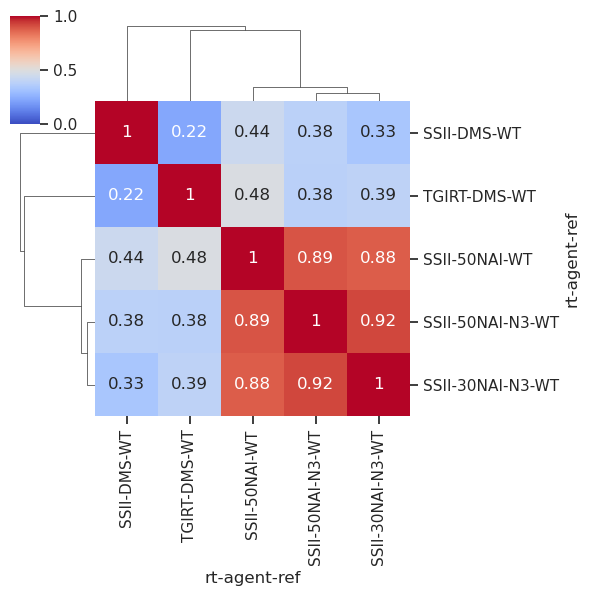

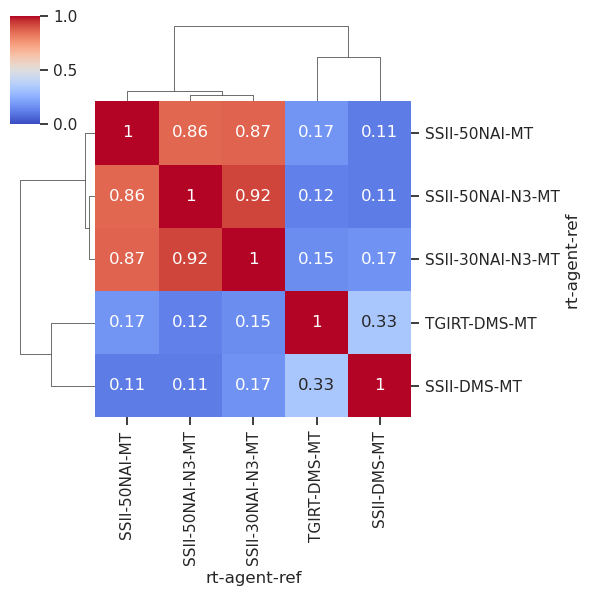

In [47]:
bulk_riboswitches_df = load_large_dataFrame("../mux11961/processing/wide_matrix/wide_reactivity.merge_ref.matrix.csv", header=[0,1,2,3,4], index_col=[0,1])
bulk_riboswitches_df = winsorize_1nt(bulk_riboswitches_df, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)
bulk_riboswitches_df = bulk_riboswitches_df.stack([0,1,2,3,4]).to_frame('reac').reset_index()
bulk_riboswitches_df = bulk_riboswitches_df.loc[bulk_riboswitches_df['gene'].isin(['Den1', 'FTL6', 'HIV', 'TPP_Thim', 'Tetrahymena','ydaO_ATP', 'yitj_SAM', 'ypaA_FMN'])]

bulk_riboswitches_df_wt = bulk_riboswitches_df.loc[bulk_riboswitches_df['ref']=='WT']
bulk_riboswitches_df_mt = bulk_riboswitches_df.loc[bulk_riboswitches_df['ref']=='MT']

sns.clustermap(bulk_riboswitches_df_wt.pivot(index=['gene','pos'], columns=['rt','agent','ref'], values='reac').corr(method="pearson"), cmap="coolwarm", vmin=0,vmax=1, annot=True,
              figsize=(6,6))
plt.show()

sns.clustermap(bulk_riboswitches_df_mt.pivot(index=['gene','pos'], columns=['rt','agent','ref'], values='reac').corr(method="pearson"), cmap="coolwarm", vmin=0,vmax=1, annot=True,
              figsize=(6,6))
plt.show()

## 3. heterogeneity of riboswitches/ribosnitches

In [12]:
def merge_wt_mt_ref(mutant_df):
    concat_categories_lst = []
    for ref, subset in mutant_df.copy().groupby(level=['ref'], axis=1):
        #print (subset)
        ## change ref labels on gene
        concat_lst = []
        for gene, gene_subset in subset.groupby(level='gene'):
            if ref in gene:
                gene = gene.split("_")[0]
                idx_df = gene_subset.index.to_frame()
                idx_df.index = list(range(idx_df.index.size))
                idx_df['gene'] = gene
                idx_df['gene'] = idx_df['gene'].astype(str)
                idx_df['pos'] = idx_df['pos'].astype(np.int64)
                gene_subset.index = pd.MultiIndex.from_frame(idx_df)
                concat_lst.append(gene_subset)
            elif {"WT":'MT',"MT":'WT'}[ref] in gene:
                continue
            else:
                concat_lst.append(gene_subset)
        mutant_df = pd.concat(concat_lst)
        concat_categories_lst.append(mutant_df)
    out_mutant_df = pd.concat(concat_categories_lst, axis=1)
    out_mutant_df = out_mutant_df.sort_index()
    return out_mutant_df

In [68]:
riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
riboswitch_reac

riboswitch_mutrate = mutrate_df.loc[:, mutrate_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
#riboswitch_mutant = mutant_df.loc[:, riboswitch_reac.columns]
#riboswitch_mutrate = mutrate_df.loc[:, riboswitch_reac.columns]
#riboswitch_coverage = coverage_df.loc[:, riboswitch_reac.columns]

riboswitch_mutant = merge_wt_mt_ref(riboswitch_mutant)
riboswitch_mutrate = merge_wt_mt_ref(riboswitch_mutrate)
riboswitch_coverage = merge_wt_mt_ref(riboswitch_coverage)

#riboswitch_coverage
#riboswitch_mutant = riboswitch_mutant.mask(riboswitch_coverage<2000, np.nan)
#riboswitch_mutrate = riboswitch_mutrate.mask(riboswitch_coverage<2000, np.nan)
#riboswitch_coverage = riboswitch_coverage.mask(riboswitch_coverage<2000, np.nan)

In [27]:
riboswitch_reac.loc[riboswitch_reac.index.isin(riboswitch_mutant.index)].index.get_level_values('gene').unique()

Index(['Den1', 'HIV', 'TPP_Thim', 'Tetrahymena', 'human_large', 'human_small',
       'ydaO_ATP', 'yitj_SAM', 'ypaA_FMN'],
      dtype='object', name='gene')

In [54]:
#riboswitch_mutant.loc[riboswitch_reac.index].index.get_level_values('gene').unique()
#riboswitch_coverage.loc[riboswitch_reac.index]

In [67]:
coverage_df.xs('DMSO', level="treatment", axis=1).xs('in_vivo', level="transfer", axis=1).xs("WT", level="ref", axis=1).loc["Tetrahymena_WT"].dropna()

sample_id,RHX644,RHX651,RHX658,RHX665
cell_id,W1,W2,W3,W4
pos,,,,
1,3000.0,4294.0,2963.0,3119.0
2,3934.0,5692.0,3824.0,4049.0
3,5346.0,7840.0,5164.0,5526.0
4,5817.0,8513.0,5604.0,6020.0
5,6626.0,9750.0,6365.0,6937.0
...,...,...,...,...
417,2770.0,3745.0,2110.0,2527.0
418,2705.0,3624.0,2029.0,2434.0


In [144]:
riboswitch_coverage.index.get_level_values('gene').unique()

Index(['Den1', 'FTL6', 'HIV', 'TPP_Thim', 'Tetrahymena', 'human_large',
       'human_small', 'ydaO_ATP', 'yitj_SAM', 'ypaA_FMN'],
      dtype='object', name='gene')

In [55]:
mutrate_df.index.get_level_values('gene').unique()

Index(['Tetrahymena_WT', 'Den1_WT', 'FTL6_WT', 'HIV_WT', 'ydaO_ATP',
       'TPP_Thim', 'ypaA_FMN', 'yitj_SAM', 'human_large', 'human_small',
       'Tetrahymena_MT', 'Den1_MT', 'FTL6_MT', 'HIV_MT'],
      dtype='object', name='gene')

In [125]:
def calculate_Rsq_of_coverage_to_mutant(mutant_df, coverage_df):
    mutant_df = mutant_df.dropna(how="all")
    coverage_df = coverage_df.dropna(how="all")
    intersect_index = mutant_df.index.intersection(coverage_df.index)
    concat_list = []
    for idx in intersect_index:
        mutant_series = mutant_df.loc[idx]
        coverage_series = coverage_df.loc[idx]
        mutant_series = mutant_series.dropna()
        coverage_series = coverage_series.dropna()
        intersect_index = mutant_series.index.intersection(coverage_series.index)
        mutant_series = mutant_series.loc[intersect_index]
        coverage_series = coverage_series.loc[intersect_index]
        
        if (mutant_series.size <= 5) or (coverage_series.size <= 5):
            continue
        # print (mutant_series)
        # print (coverage_series)
        try:
            slope, intercept, r, p, stderr = stats.linregress(coverage_series, mutant_series)
        except:
            slope, intercept, r, p, stderr = np.nan, np.nan, np.nan, np.nan, np.nan
        out_series = pd.Series([slope, intercept, r, p, stderr], index=['slope','intercept','r','p','stderr'], name=idx)
        out_series['rsq'] = np.power(out_series['r'], 2)
        #print (out_series)
        #out_series.name = pd.MultiIndex.from_tuples(idx, names=['gene','pos'])
        concat_list.append(out_series)
    out = pd.concat(concat_list, axis=1)
    out = out.T
    out.index.names = ['gene', 'pos']
    return out

def heterogeneity_by_rsquare(mutant_df, coverage_df):
    dmso_mutant = mutant_df.loc[:, mutant_df.columns.get_level_values('treatment')=="DMSO"]
    nain3_mutant = mutant_df.loc[:, mutant_df.columns.get_level_values('treatment')=="NAI_N3"]
    dmso_coverage = coverage_df.loc[:, coverage_df.columns.get_level_values('treatment')=="DMSO"]
    nain3_coverage = coverage_df.loc[:, coverage_df.columns.get_level_values('treatment')=="NAI_N3"]
    
    #dmso_rsquare = calculate_Rsq_of_coverage_to_mutant(dmso_mutant, dmso_coverage)
    nai_rsquare = calculate_Rsq_of_coverage_to_mutant(nain3_mutant, nain3_coverage)
    #return dmso_rsquare, nai_rsquare
    return nai_rsquare   

In [173]:
concat_lst = []
for transfer in ['in_vivo', 'in_vitro']:
    local_mutant = riboswitch_mutant.loc[:, riboswitch_mutant.columns.get_level_values('transfer')==transfer]
    local_coverage = riboswitch_coverage.loc[:,riboswitch_coverage.columns.get_level_values('transfer')==transfer] 
    ref_rsquare = heterogeneity_by_rsquare(local_mutant, local_coverage)
    ref_rsquare['transfer'] = transfer
    
    concat_lst.append(ref_rsquare)
    # for ref in ['WT','MT']:
    #     ref_mutant = local_mutant.loc[:, local_mutant.columns.get_level_values('ref')==ref]
    #     ref_coverage = local_coverage.loc[:,local_coverage.columns.get_level_values('ref')==ref]    
    #     ref_rsquare = heterogeneity_by_rsquare(ref_mutant, ref_coverage)
rsquare_df = pd.concat(concat_lst)
rsquare_df

slope   intercept         r             p    stderr  \
gene     pos                                                           
Den1     1    0.516657   95.833597  0.959316  3.039458e-25  0.023188   
         2    0.145342  155.919242  0.887953  3.994367e-17  0.011100   
         3    0.145444  -58.209600  0.886456  5.330316e-17  0.011196   
         4    0.188413 -156.009690  0.964374  3.297463e-28  0.007621   
         5    0.129324 -140.066224  0.950164  6.375567e-25  0.006256   
...                ...         ...       ...           ...       ...   
ypaA_FMN 348  0.165091 -127.717236  0.982116  3.619902e-29  0.005134   
         349  0.030811   19.336019  0.976673  5.383042e-27  0.001099   
         350  0.689823 -336.071511  0.991672  1.943227e-35  0.014533   
         351  0.976635  -29.036802  0.999964  3.787199e-78  0.001371   
         352  0.984465  -17.222294  0.999946  5.576226e-67  0.001788   

                   rsq  transfer  
gene     pos                      
Den1     1    0.920287   in_vivo  
         2    0.788460   in_vivo  
         3    0.785804   in_vivo  
         4    0.930016   in_vivo  
         5    0.902812   in_vivo  
...                ...       ...  
ypaA_FMN 348  0.964553  in_vitro  
         349  0.953890  in_vitro  
         350  0.983412  in_vitro  
         351  0.999927  in_vitro  
         352  0.999891  in_vitro  

[16807 rows x 7 columns]

In [174]:
rsquare_df.reset_index().pivot(index=['gene','pos'], values="rsq", columns="transfer")

transfer      in_vitro   in_vivo
gene     pos                    
Den1     1    0.972018  0.920287
         2    0.839778  0.788460
         3    0.898981  0.785804
         4    0.959773  0.930016
         5    0.977359  0.902812
...                ...       ...
ypaA_FMN 348  0.964553  0.900489
         349  0.953890  0.862795
         350  0.983412  0.944478
         351  0.999927  0.998178
         352  0.999891       NaN

[8502 rows x 2 columns]

### 3.2 plot reac & rsquare for each gene

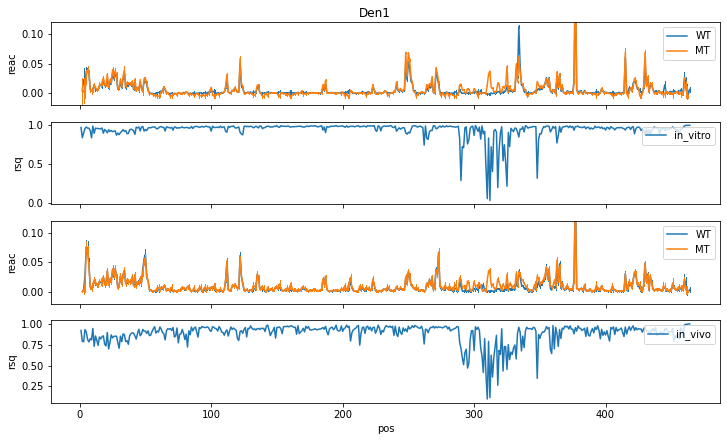

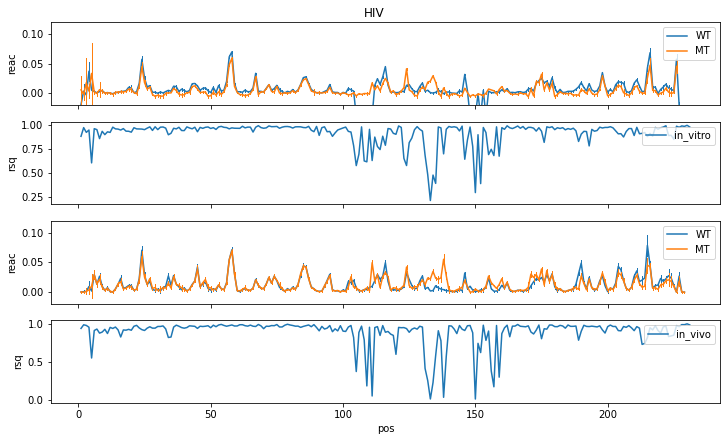

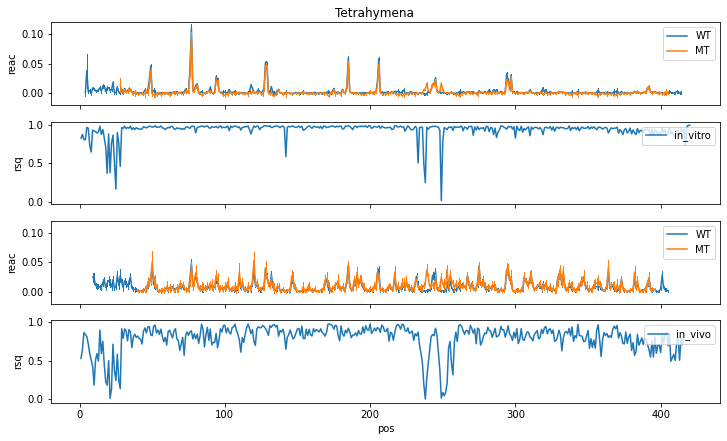

In [192]:

winsorized_riboswitch_reac = winsorize_1nt(riboswitch_reac, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)

for gene, gene_subset in winsorized_riboswitch_reac.groupby(level="gene"):
    if gene not in ['Den1','HIV','Tetrahymena']:
        continue
    wide_vitro_reac = gene_subset.xs('in_vitro', level="transfer", drop_level=False, axis=1)
    wide_vivo_reac = gene_subset.xs('in_vivo', level="transfer", drop_level=False, axis=1)
    vitro_reac = wide_vitro_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
    vivo_reac = wide_vivo_reac.stack([0,1,2,3,4]).to_frame('reac').reset_index()
    
    gene_rsq = rsquare_df.loc[gene].reset_index()
    gene_rsq_vitro = rsquare_df.loc[rsquare_df['transfer']=="in_vitro"].reset_index()
    gene_rsq_vivo = rsquare_df.loc[rsquare_df['transfer']=="in_vivo"].reset_index()
    
    
    fig, axs = plt.subplots(4,1, figsize=(12, 7), sharex=True)
    sns.lineplot(data=vitro_reac, x="pos", y="reac", hue="ref", ax=axs[0],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.lineplot(data=gene_rsq.loc[gene_rsq['transfer']=="in_vitro"], x="pos", y="rsq", hue="transfer", ax=axs[1],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.lineplot(data=vivo_reac, x="pos", y="reac", hue="ref", ax=axs[2],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    sns.lineplot(data=gene_rsq.loc[gene_rsq['transfer']=="in_vivo"], x="pos", y="rsq", hue="transfer", ax=axs[3],  err_style='bars', ci="sd", err_kws={'elinewidth':1})
    
    axs[0].legend(loc="upper right")
    axs[1].legend(loc="upper right")
    axs[2].legend(loc="upper right")
    axs[3].legend(loc="upper right")
    
    axs[0].legend(loc="upper right")
    axs[0].set_ylim(-0.02, 0.12)
    axs[2].set_ylim(-0.02, 0.12)
    

    
    plt.suptitle(gene, y=0.91)
    #plt.savefig("Figures/Fig_x4.heterogeneity_of_riboswitches/{}.heterogeneity_at_structure_changed_regions.pdf".format(gene))
    plt.show()

In [170]:
gene_rsq

,pos,slope,intercept,r,p,stderr,rsq,transfer
0,1,0.077441,122.617709,0.713449,1.139786e-07,0.012026,0.509009,in_vivo
1,2,0.089963,-17.345627,0.883292,2.095268e-15,0.007368,0.780206,in_vivo
2,3,0.318796,-161.676324,0.894853,2.632307e-16,0.024537,0.800763,in_vivo
3,4,0.523838,-1661.250000,0.883767,1.932707e-15,0.042797,0.781044,in_vivo
4,5,0.019368,246.012630,0.391809,8.532542e-03,0.007018,0.153515,in_vivo
...,...,...,...,...,...,...,...,...
699,348,0.168099,-153.914070,0.991184,9.756131e-37,0.003553,0.982446,in_vitro
700,349,0.029256,33.465023,0.984628,6.206833e-32,0.000821,0.969492,in_vitro
701,350,0.726782,-737.174902,0.994692,3.944641e-41,0.011887,0.989413,in_vitro
702,351,0.979995,-47.608685,0.999975,4.114363e-53,0.001417,0.999950,in_vitro


## 4. Accuracy of Tetrahymena

In [72]:
tetra_pair_df = load_large_dataFrame("benchmark_secondary_structure/Tetrahymena.pairing.txt", index_col=[0,1])
tetra_pair_df['unpair'] = 0
tetra_pair_df.loc[tetra_pair_df['dbrt']==".",'unpair'] = 1
tetra_pair_df

local.pos nt           x           y dbrt  unpair
gene        pos                                                   
Tetrahymena 29           1  G   98.765622  762.041486    .       1
            30           2  G  116.265622  762.041486    .       1
            31           3  A  133.765622  762.041486    .       1
            32           4  G  151.265622  762.041486    .       1
            33           5  G  168.765622  762.041486    .       1
...                    ... ..         ...         ...  ...     ...
            417        389  A  816.460911  726.177218    .       1
            418        390  C  811.464319  735.191901    .       1
            419        391  U  803.765622  742.041486    )       0
            420        392  C  803.765622  762.041486    )       0
            421        393  G  821.265622  762.041486    .       1

[393 rows x 6 columns]

In [9]:
riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
tetra_reac_df = riboswitch_reac.groupby(level=['transfer','ref'], axis=1).mean()
tetra_reac_df = tetra_reac_df.loc[tetra_reac_df.index.get_level_values('gene')=="Tetrahymena"]
tetra_reac_df = tetra_reac_df.xs('WT', level="ref", axis=1)

#tetra_reac_df = gene_normalization_1nt(tetra_reac_df)
#tetra_reac_df

In [27]:
bulk_riboswitches_df = load_large_dataFrame("../mux11961/wide_matrix/wide_reactivity.merge_ref.matrix.csv", header=[0,1,2,3,4], index_col=[0,1])
bulk_riboswitches_df = winsorize_1nt(bulk_riboswitches_df, bottom_winsorize=0.05, top_winsorize=0, gene_winsorize=True)
bulk_riboswitches_df = bulk_riboswitches_df.stack([0,1,2,3,4]).to_frame('reac').reset_index()
bulk_riboswitches_df = bulk_riboswitches_df.loc[(bulk_riboswitches_df['rt']=="SSII")&(bulk_riboswitches_df['agent']=='50NAI-N3')]
bulk_riboswitches_df
tetra_bulk = bulk_riboswitches_df.loc[bulk_riboswitches_df['gene']=="Tetrahymena"]
tetra_bulk = tetra_bulk.loc[tetra_bulk['ref']=="WT"]
tetra_bulk = tetra_bulk.set_index(['gene','pos'])
tetra_bulk = tetra_bulk[['reac']]
tetra_bulk.columns = ["bulk"]
tetra_bulk

tetra_bulk = gene_normalization_1nt(tetra_bulk)

In [42]:
tetra_df = pd.concat([tetra_reac_df, tetra_pair_df, tetra_bulk], axis=1, join="inner")
tetra_df = tetra_df.dropna()
tetra_df
#tetra_df.to_csv("benchmark_secondary_structure/Tetrahymena.pairing.add_gnom_reac.WT.txt")

in_vitro   in_vivo  local.pos nt           x           y  \
gene        pos                                                             
Tetrahymena 29   0.004882  0.017308          1  G   98.765622  762.041486   
            30  -0.003494  0.006530          2  G  116.265622  762.041486   
            31   0.007840  0.018371          3  A  133.765622  762.041486   
            32   0.001834  0.013354          4  G  151.265622  762.041486   
            33   0.004793  0.009530          5  G  168.765622  762.041486   
...                   ...       ...        ... ..         ...         ...   
            415  0.002508  0.008003        387  G  816.458765  705.868101   
            416 -0.017537  0.061241        388  U  818.189433  716.024442   
            417  0.006030 -0.023821        389  A  816.460911  726.177218   
            418  0.052555 -0.040252        390  C  811.464319  735.191901   
            419  0.014099 -0.036298        391  U  803.765622  742.041486   

                dbrt  unpair      bulk  
gene        pos                         
Tetrahymena 29     .       1  0.666760  
            30     .       1  0.121165  
            31     .       1  0.603289  
            32     .       1  0.403248  
            33     .       1  0.624749  
...              ...     ...       ...  
            415    .       1 -0.039754  
            416    .       1 -0.084778  
            417    .       1  1.053989  
            418    .       1  0.637889  
            419    )       0  0.042915  

[391 rows x 9 columns]

In [9]:
# roc curve and auc
from sklearn.datasets import make_classification
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score
from matplotlib import pyplot

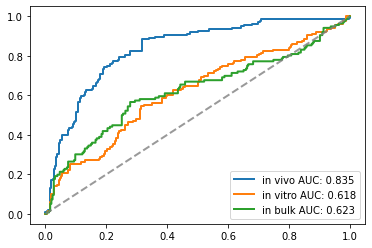

0.8347750865051904 0.6177912341407151 0.6229815455594002


In [29]:
#tetra_df.to_csv("benchmark_secondary_structure/Tetrahymena.pairing.add_gnom_reac.txt")
tetra_df = load_large_dataFrame("benchmark_secondary_structure/Tetrahymena.pairing.add_gnom_reac.txt")


roc_vivo =  roc_auc_score(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vivo'].to_list())
roc_vitro =  roc_auc_score(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vitro'].to_list())
roc_bulk =  roc_auc_score(tetra_df['unpair'].astype("bool").to_list(), tetra_df['bulk'].to_list())

vivo_fpr, vivo_tpr, _ = roc_curve(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vivo'].to_list())
vitro_fpr, vitro_tpr, _ = roc_curve(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vitro'].to_list())
bulk_fpr, bulk_tpr, _ = roc_curve(tetra_df['unpair'].astype("bool").to_list(), tetra_df['bulk'].to_list())

fig, ax = plt.subplots()
ax.plot(vivo_fpr, vivo_tpr, marker='.', label='in vivo AUC: {}'.format(np.round(roc_vivo,3)), linewidth=2, markersize=0, ) #color="blue" 
ax.plot(vitro_fpr, vitro_tpr, marker='.', label='in vitro AUC: {}'.format(np.round(roc_vitro,3)), linewidth=2, markersize=0, ) #color="blue" 
ax.plot(bulk_fpr, bulk_tpr, marker='.', label='in bulk AUC: {}'.format(np.round(roc_bulk,3)), linewidth=2, markersize=0, ) #color="blue" 

ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="grey", alpha=0.8)
plt.legend()
#plt.savefig("ROC.reac.pdf")
plt.show()
print (roc_vivo, roc_vitro, roc_bulk)

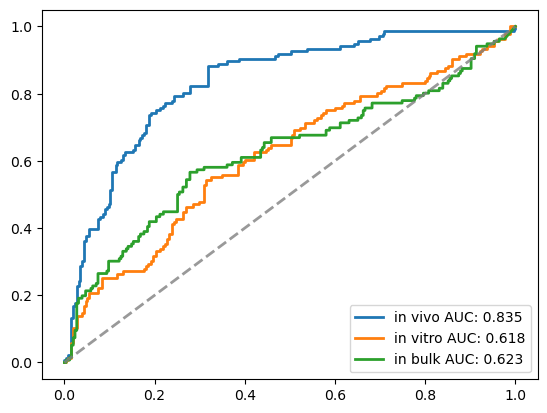

0.8347750865051904 0.6177912341407151 0.6229815455594002


In [13]:
#tetra_df.to_csv("benchmark_secondary_structure/Tetrahymena.pairing.add_gnom_reac.txt")
tetra_df = load_large_dataFrame("benchmark_secondary_structure/Tetrahymena.pairing.add_gnom_reac.txt", index_col=[0,1])


roc_vivo =  roc_auc_score(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vivo'].to_list())
roc_vitro =  roc_auc_score(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vitro'].to_list())
roc_bulk =  roc_auc_score(tetra_df['unpair'].astype("bool").to_list(), tetra_df['bulk'].to_list())

vivo_fpr, vivo_tpr, _ = roc_curve(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vivo'].to_list())
vitro_fpr, vitro_tpr, _ = roc_curve(tetra_df['unpair'].astype("bool").to_list(), tetra_df['in_vitro'].to_list())
bulk_fpr, bulk_tpr, _ = roc_curve(tetra_df['unpair'].astype("bool").to_list(), tetra_df['bulk'].to_list())

fig, ax = plt.subplots()
ax.plot(vivo_fpr, vivo_tpr, marker='.', label='in vivo AUC: {}'.format(np.round(roc_vivo,3)), linewidth=2, markersize=0, ) #color="blue" 
ax.plot(vitro_fpr, vitro_tpr, marker='.', label='in vitro AUC: {}'.format(np.round(roc_vitro,3)), linewidth=2, markersize=0, ) #color="blue" 
ax.plot(bulk_fpr, bulk_tpr, marker='.', label='in bulk AUC: {}'.format(np.round(roc_bulk,3)), linewidth=2, markersize=0, ) #color="blue" 

ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="grey", alpha=0.8)
plt.legend()
#plt.savefig("ROC.reac.pdf")
plt.show()
print (roc_vivo, roc_vitro, roc_bulk)

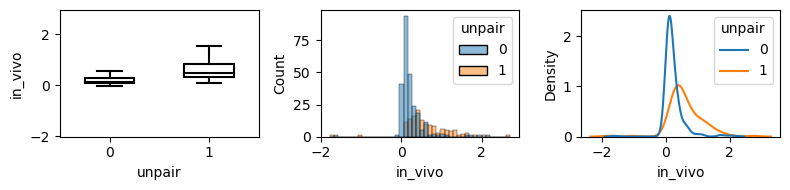

In [21]:
fig, axs = plt.subplots(1,3, figsize=(8,2))

PROPS = {
    'boxprops':{'facecolor':'none', 'edgecolor':'black'},
    'medianprops':{'color':'black'},
    'whiskerprops':{'color':'black'},
    'capprops':{'color':'black'}
}

ax = axs[0]
sns.boxplot(data=tetra_df, x="unpair", y="in_vivo", showfliers=True, color='white', width=.5, fliersize=0, ax=ax, **PROPS)
#plt.setp(ax.artists, edgecolor = 'black', facecolor='w')
#plt.setp(ax.lines, color='black')
#ax.set_ylim(-0.005,0.07)

ax = axs[1]
#sns.histplot(data=tetra_df,x="in_vivo")
sns.histplot(data=tetra_df, x="in_vivo", hue="unpair", common_norm=False, ax=ax)
#ax.set_xlim(-0.01,0.07)

ax = axs[2]
sns.kdeplot(data=tetra_df, x="in_vivo", hue="unpair", common_norm=False, ax=ax)
#ax.set_xlim(-0.02,0.07)
plt.tight_layout()
#plt.savefig("Accuracy_by_Unpaired.Tetrahymena.boxplot.density.pdf")
plt.show()

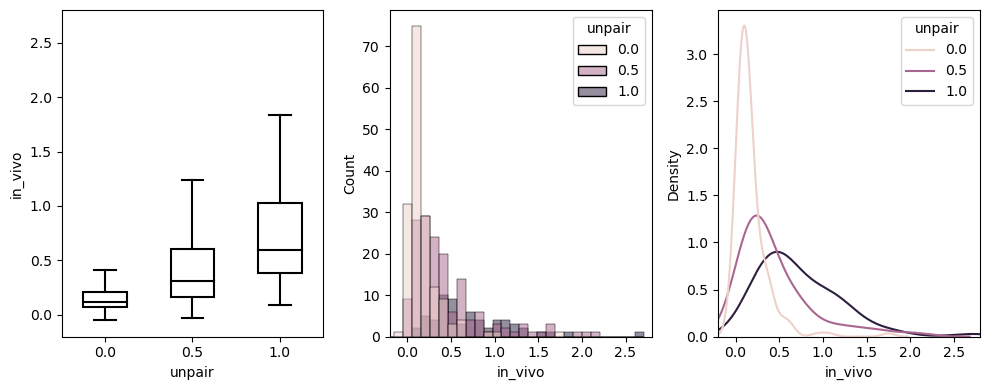

In [24]:
previous = None
boundary_concat_lst = []
out_concat_lst = []
for (gene, pos), row in tetra_df.sort_index().iterrows():
    if previous == row['unpair']:
        pass
    elif previous != row['unpair']:
        #print (gene, pos)
        try:
            #print ()
            #out_df = tetra_df.loc[[(gene,pos-2),(gene,pos-1),(gene,pos),(gene,pos+1)]]
            out_df = tetra_df.loc[[(gene,pos-1),(gene,pos)]]
            
            out_concat_lst.append(out_df)
        except:
            pass
        previous = row['unpair']
out_df = pd.concat(out_concat_lst)
out_df = out_df.drop_duplicates().sort_index()
out_df['unpair'] = 0.5

tetra_df_changeboundary = tetra_df.loc[~tetra_df.index.isin(out_df.index)]
tetra_df_changeboundary = pd.concat([tetra_df_changeboundary, out_df]).sort_index()
tetra_df_changeboundary


fig, axs = plt.subplots(1,3, figsize=(10,4))

PROPS = {
    'boxprops':{'facecolor':'none', 'edgecolor':'black'},
    'medianprops':{'color':'black'},
    'whiskerprops':{'color':'black'},
    'capprops':{'color':'black'}
}

ax = axs[0]
sns.boxplot(data=tetra_df_changeboundary, x="unpair", y="in_vivo", showfliers=True, color='white', width=.5, fliersize=0, ax=ax, **PROPS)
#plt.setp(ax.artists, edgecolor = 'black', facecolor='w')
#plt.setp(ax.lines, color='black')
ax.set_ylim(-0.2,2.8)

ax = axs[1]
#sns.histplot(data=tetra_df,x="in_vivo")
sns.histplot(data=tetra_df_changeboundary, x="in_vivo", hue="unpair", common_norm=False, ax=ax)
ax.set_xlim(-0.2,2.8)

ax = axs[2]
sns.kdeplot(data=tetra_df_changeboundary, x="in_vivo", hue="unpair", common_norm=False, ax=ax)
ax.set_xlim(-0.2,2.8)
plt.tight_layout()
#plt.savefig("Accuracy_by_Unpaired.Tetrahymena.mark_boundary.boxplot.density.gnorm_reac.pdf")
plt.show()

In [25]:
tetra_df_changeboundary['unpair'].value_counts()


in_vitro   in_vivo  local.pos nt           x           y  \
gene        pos                                                             
Tetrahymena 29   0.544494  0.767056          1  G   98.765622  762.041486   
            30  -0.389704  0.289389          2  G  116.265622  762.041486   
            31   0.874495  0.814185          3  A  133.765622  762.041486   
            32   0.204534  0.591817          4  G  151.265622  762.041486   
            33   0.534638  0.422345          5  G  168.765622  762.041486   
...                   ...       ...        ... ..         ...         ...   
            415  0.279687  0.354678        387  G  816.458765  705.868101   
            416 -1.956013  2.714091        388  U  818.189433  716.024442   
            417  0.672539 -1.055718        389  A  816.460911  726.177218   
            418  5.861956 -1.783905        390  C  811.464319  735.191901   
            419  1.572641 -1.608686        391  U  803.765622  742.041486   

                dbrt  unpair      bulk  
gene        pos                         
Tetrahymena 29     .     1.0  0.666760  
            30     .     1.0  0.121165  
            31     .     1.0  0.603289  
            32     .     1.0  0.403248  
            33     .     1.0  0.624749  
...              ...     ...       ...  
            415    .     1.0 -0.039754  
            416    .     1.0 -0.084778  
            417    .     1.0  1.053989  
            418    .     0.5  0.637889  
            419    )     0.5  0.042915  

[391 rows x 9 columns]

### 5.2 accuracy of tetrahymena for each cell

In [70]:
riboswitch_reac = reac_df.loc[:, reac_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
tetra_reac_df = riboswitch_reac.loc[riboswitch_reac.index.get_level_values('gene')=="Tetrahymena"]
tetra_reac_df = tetra_reac_df.xs('WT', level="ref", axis=1)
tetra_reac_df = tetra_reac_df.xs('in_vivo', level="transfer", axis=1)
tetra_reac_df.columns = tetra_reac_df.columns.get_level_values('cell_id')
#tetra_reac_df = gene_normalization_1nt(tetra_reac_df)
tetra_reac_df

cell_id                W1        W9       W17        W2       W10       W18  \
gene        pos                                                               
Tetrahymena 1   -0.037781 -0.050164 -0.094156 -0.075580 -0.076386 -0.098700   
            2   -0.084529 -0.082526 -0.136268 -0.086686 -0.106346 -0.146049   
            3    0.080567  0.049127  0.112037  0.076526  0.108463  0.157846   
            4    0.080829  0.060272  0.123343  0.075691  0.119694  0.170462   
            5   -0.020966  0.006923 -0.038913 -0.031984 -0.040571 -0.086399   
...                   ...       ...       ...       ...       ...       ...   
            416  0.039031  0.053047  0.064105  0.070454  0.069240  0.057306   
            417 -0.018713  0.043104 -0.018013 -0.037572 -0.017802  0.016001   
            418 -0.066120 -0.082648  0.034834 -0.023210 -0.010302  0.001810   
            419 -0.027571 -0.027105  0.005797 -0.049346 -0.039282 -0.024455   
            420       NaN       NaN       NaN       NaN       NaN       NaN   

cell_id                W3       W11       W19        W4  ...       W21  \
gene        pos                                          ...             
Tetrahymena 1    0.005056 -0.053524  0.005778  0.018379  ...  0.023932   
            2   -0.047810 -0.079859 -0.046765 -0.019163  ...  0.007148   
            3    0.015048  0.072071  0.048460 -0.034397  ... -0.025389   
            4    0.015662  0.070931  0.030920 -0.027514  ... -0.023576   
            5   -0.004358 -0.026891 -0.001269  0.019611  ...  0.008698   
...                   ...       ...       ...       ...  ...       ...   
            416  0.098709  0.073834  0.079891  0.040968  ...  0.039452   
            417 -0.053753 -0.071087 -0.027148 -0.023082  ... -0.031435   
            418 -0.059369 -0.017184 -0.041735 -0.026878  ... -0.052137   
            419 -0.043122 -0.005494 -0.048199 -0.029534  ... -0.083430   
            420       NaN       NaN       NaN       NaN  ...       NaN   

cell_id                W6       W14       W22        W7       W15       W23  \
gene        pos                                                               
Tetrahymena 1   -0.003920 -0.039404  0.006235  0.014381  0.014302 -0.032694   
            2   -0.016637 -0.064477 -0.038800 -0.029063 -0.028692 -0.076801   
            3   -0.028395  0.029854 -0.009393  0.004507 -0.002215  0.070644   
            4   -0.023436  0.037521  0.003387 -0.000356  0.000083  0.079697   
            5    0.038850 -0.019075  0.002569  0.019385  0.005789 -0.028303   
...                   ...       ...       ...       ...       ...       ...   
            416  0.072956  0.071607  0.021004  0.053136  0.084440  0.041995   
            417 -0.042977 -0.041817 -0.014674 -0.012139 -0.043612  0.000636   
            418 -0.049636 -0.030573 -0.038143 -0.049281 -0.069894 -0.114490   
            419 -0.037088 -0.031687 -0.034731 -0.002257 -0.040501 -0.037112   
            420       NaN       NaN       NaN       NaN       NaN       NaN   

cell_id                W8       W16       W24  
gene        pos                                
Tetrahymena 1   -0.020913 -0.071714 -0.047124  
            2   -0.079249 -0.113719 -0.088222  
            3    0.057304  0.093857  0.053057  
            4    0.053250  0.103975  0.065335  
            5   -0.031463 -0.039841 -0.017930  
...                   ...       ...       ...  
            416  0.048604  0.028911  0.057486  
            417 -0.012824 -0.024439 -0.033447  
            418 -0.010282 -0.014095 -0.028753  
            419 -0.037665 -0.030418 -0.031855  
            420       NaN       NaN       NaN  

[420 rows x 24 columns]

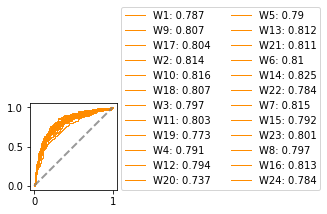

In [43]:
auc_lst = []
fig, ax = plt.subplots()
plt.subplots_adjust(left=0.1, right=0.3, top=0.4, bottom=0.1)
for col in tetra_reac_df.columns:
    cell_reac = tetra_reac_df[[col]]
    cell_reac = pd.concat([cell_reac, tetra_pair_df], axis=1, join="inner").dropna()

    roc_cell =  roc_auc_score(cell_reac['unpair'].astype("bool").to_list(), cell_reac[col].to_list())
    auc_lst.append(roc_cell)
    cell_fpr, cell_tpr, _ = roc_curve(cell_reac['unpair'].astype("bool").to_list(), cell_reac[col].to_list())
    ax.plot(cell_fpr, cell_tpr, marker='.', label='{}: {}'.format(col, np.round(roc_cell,3)), linewidth=1, markersize=0, color="darkorange" ) #color="blue" 
ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="grey", alpha=0.8, )
plt.legend(loc=[1.05,0], ncol=2)
#plt.savefig("ROC.reac.tetrahymena.pdf")
plt.show()

0.737226066897347 0.8251153402537486
0.4942974452554745 0.5113765967153285


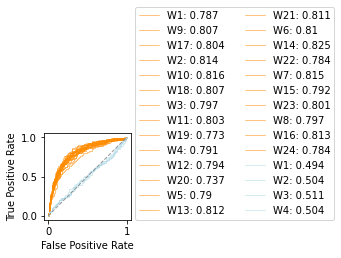

In [83]:
riboswitch_mutrate

tetra_mutrate_df = riboswitch_mutrate.loc[riboswitch_mutrate.index.get_level_values('gene')=="Tetrahymena"]
tetra_mutrate_df = tetra_mutrate_df.xs('WT', level="ref", axis=1)
tetra_mutrate_df = tetra_mutrate_df.xs('DMSO', level="treatment", axis=1)
tetra_mutrate_df = tetra_mutrate_df.xs('in_vivo', level="transfer", axis=1)
tetra_mutrate_df.columns = tetra_mutrate_df.columns.get_level_values('cell_id')
#tetra_reac_df = gene_normalization_1nt(tetra_reac_df)
tetra_mutrate_df


auc_lst = []
fig, ax = plt.subplots()
plt.subplots_adjust(left=0.1, right=0.3, top=0.4, bottom=0.1)
for col in tetra_reac_df.columns:
    cell_reac = tetra_reac_df[[col]]
    cell_reac = pd.concat([cell_reac, tetra_pair_df], axis=1, join="inner").dropna()

    roc_cell =  roc_auc_score(cell_reac['unpair'].astype("bool").to_list(), cell_reac[col].to_list())
    auc_lst.append(roc_cell)
    cell_fpr, cell_tpr, _ = roc_curve(cell_reac['unpair'].astype("bool").to_list(), cell_reac[col].to_list())
    ax.plot(cell_fpr, cell_tpr, marker='.', label='{}: {}'.format(col, np.round(roc_cell,3)), linewidth=0.5, markersize=0, color="darkorange" ) #color="blue" 
print (min(auc_lst), max(auc_lst))
auc_lst = []
for col in tetra_mutrate_df.columns:
    cell_reac = tetra_mutrate_df[[col]]
    cell_reac = pd.concat([cell_reac, tetra_pair_df], axis=1, join="inner").dropna()

    roc_cell =  roc_auc_score(cell_reac['unpair'].astype("bool").to_list(), cell_reac[col].to_list())
    auc_lst.append(roc_cell)
    cell_fpr, cell_tpr, _ = roc_curve(cell_reac['unpair'].astype("bool").to_list(), cell_reac[col].to_list())
    ax.plot(cell_fpr, cell_tpr, marker='.', label='{}: {}'.format(col, np.round(roc_cell,3)), linewidth=0.5, markersize=0, color="lightblue" ) #color="blue" 
print (min(auc_lst), max(auc_lst))
ax.plot([0, 1], [0, 1], linestyle="--", lw=1, color="grey", alpha=0.8, )

plt.legend(loc=[1.05,0], ncol=2)
ax.set_xlabel("False Positive Rate")
ax.set_ylabel("True Positive Rate")
#plt.savefig("ROC.reac.tetrahymena.pdf")
plt.show()

## 5. Accuracy of mutrate

In [ ]:
riboswitch_mutrate

tetra_mutrate_df = riboswitch_mutrate.groupby(level=['transfer','ref'], axis=1).mean()
tetra_mutrate_df = tetra_mutrate_df.loc[tetra_mutrate_df.index.get_level_values('gene')=="Tetrahymena"]
tetra_mutrate_df = tetra_mutrate_df.xs('WT', level="ref", axis=1)
tetra_mutrate_df = tetra_mutrate_df.dropna()

tetra_mutrate_df = pd.concat([tetra_mutrate_df, tetra_pair_df], axis=1, join="inner")
tetra_mutrate_df = tetra_mutrate_df.dropna()

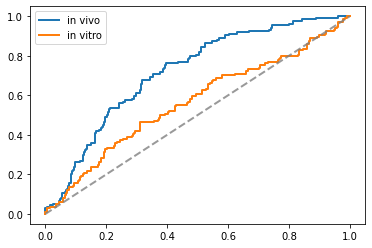

0.7185920789752027 0.5636678810671055


In [62]:
roc_vivo =  roc_auc_score(tetra_mutrate_df['unpair'].astype("bool").to_list(), tetra_mutrate_df['in_vivo'].to_list())
roc_vitro =  roc_auc_score(tetra_mutrate_df['unpair'].astype("bool").to_list(), tetra_mutrate_df['in_vitro'].to_list())


vivo_fpr, vivo_tpr, _ = roc_curve(tetra_mutrate_df['unpair'].astype("bool").to_list(), tetra_mutrate_df['in_vivo'].to_list())
vitro_fpr, vitro_tpr, _ = roc_curve(tetra_mutrate_df['unpair'].astype("bool").to_list(), tetra_mutrate_df['in_vitro'].to_list())


fig, ax = plt.subplots()
ax.plot(vivo_fpr, vivo_tpr, marker='.', label='in vivo', linewidth=2, markersize=0, ) #color="blue" 
ax.plot(vitro_fpr, vitro_tpr, marker='.', label='in vitro', linewidth=2, markersize=0, ) #color="blue" 

ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="grey", alpha=0.8)
plt.legend()
plt.show()
print (roc_vivo, roc_vitro)

In [30]:
dmso_mutrate_df = mutrate_df.xs('DMSO', level="treatment", axis=1).groupby(['transfer','ref'], axis=1).mean()
dmso_mutrate_df = dmso_mutrate_df.loc[:, dmso_mutrate_df.columns.get_level_values('transfer').isin(['in_vitro','in_vivo'])]
dmso_mutrate_df

transfer           in_vitro           in_vivo          
ref                      MT        WT      MT        WT
gene           pos                                     
Tetrahymena_WT 1        NaN  0.416662     NaN  0.349850
               2        NaN  0.393270     NaN  0.355477
               3        NaN  0.511060     NaN  0.529535
               4        NaN  0.437279     NaN  0.479837
               5        NaN  0.252589     NaN  0.253155
...                     ...       ...     ...       ...
human_large    757      NaN  0.000000     NaN       NaN
               758      NaN  0.000000     NaN       NaN
               759      NaN  0.000000     NaN       NaN
               760      NaN  0.000000     NaN       NaN
               761      NaN  0.000000     NaN       NaN

[12370 rows x 4 columns]

In [42]:
concat_categories_lst = []
for (transfer,ref), subset in mutrate_df.groupby(level=['transfer','ref'], axis=1):
    if transfer == "18s":
        continue
    print (transfer, ref)
    local_coverage_df = avg_coverage.loc[avg_coverage.loc[:, (avg_coverage.columns.get_level_values('transfer')==transfer)&(avg_coverage.columns.get_level_values('ref')==ref)].min(axis=1) > coverage_threshold]
    
    dmso_df = subset.xs('DMSO', level="treatment", axis=1, drop_level=False)
    nain3_df = subset.xs('NAI_N3', level="treatment", axis=1, drop_level=False)
    nain3_df = nain3_df.sort_index()

    ## change ref labels on gene
    concat_lst = []
    for gene, gene_subset in dmso_df.groupby(level='gene'):
        if ref in gene:
            gene = gene.split("_")[0]
        elif {"MT":"WT","WT":"MT"}[ref] in gene:
            continue
        print ("#"+gene+"#")
        idx_df = gene_subset.index.to_frame()
        idx_df.index = list(range(idx_df.index.size))
        idx_df['gene'] = gene
        idx_df['gene'] = idx_df['gene'].astype(str)
        idx_df['pos'] = idx_df['pos'].astype(np.int64)
        gene_subset.index = pd.MultiIndex.from_frame(idx_df)
        concat_lst.append(gene_subset)
    local_mr_df = pd.concat(concat_lst)
    concat_categories_lst.append(local_mr_df)
dmso_mutrate = pd.concat(concat_categories_lst, axis=1)
dmso_mutrate = dmso_mutrate.sort_index()
dmso_mutrate

in_vitro MT
#Den1#
#FTL6#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#
in_vitro WT
#Den1#
#FTL6#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#
in_vivo MT
#Den1#
#FTL6#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#
in_vivo WT
#Den1#
#FTL6#
#HIV#
#TPP_Thim#
#Tetrahymena#
#human_large#
#human_small#
#ydaO_ATP#
#yitj_SAM#
#ypaA_FMN#


sample_id       RHX734    RHX740    RHX746    RHX700    RHX707    RHX714  \
transfer      in_vitro  in_vitro  in_vitro  in_vitro  in_vitro  in_vitro   
treatment         DMSO      DMSO      DMSO      DMSO      DMSO      DMSO   
ref                 MT        MT        MT        WT        WT        WT   
cell_id             M2        M3        M4        W1        W2        W3   
gene     pos                                                               
Den1     1    0.757473  0.750695  0.716453  0.772549  0.780887  0.767330   
         2    0.359885  0.324069  0.248356  0.339475  0.317758  0.327254   
         3    0.254787  0.211346  0.164599  0.241590  0.225717  0.222241   
         4    0.158127  0.135535  0.153108  0.146790  0.145522  0.146372   
         5    0.051256  0.052632  0.054187  0.047450  0.045004  0.049770   
...                ...       ...       ...       ...       ...       ...   
ypaA_FMN 348  0.131770  0.127625  0.112321  0.128470  0.126954  0.139558   
         349  0.028236  0.034147  0.033825  0.024511  0.030219  0.033409   
         350  0.617993  0.571489  0.525728  0.615176  0.609799  0.588461   
         351  0.975809  0.970886  0.967071  0.974769  0.978212  0.966465   
         352  0.981200  0.979461  0.980743  0.978028  0.978967  0.979092   

sample_id       RHX721    RHX728    RHX672    RHX679    RHX686    RHX693  \
transfer      in_vitro  in_vitro   in_vivo   in_vivo   in_vivo   in_vivo   
treatment         DMSO      DMSO      DMSO      DMSO      DMSO      DMSO   
ref                 WT        WT        MT        MT        MT        MT   
cell_id             W4        M1        M1        M2        M3        M4   
gene     pos                                                               
Den1     1    0.765672  0.732984  0.745886  0.714110  0.703643  0.743552   
         2    0.268962  0.318439  0.222325  0.206427  0.184828  0.207729   
         3    0.196629  0.222804  0.145540  0.126618  0.159228  0.130984   
         4    0.170227  0.160162  0.159196  0.152377  0.187043  0.157236   
         5    0.047020  0.054613  0.042156  0.040096  0.053000  0.042192   
...                ...       ...       ...       ...       ...       ...   
ypaA_FMN 348  0.129485  0.138983  0.117542  0.089766  0.115695  0.097897   
         349  0.028784  0.031158  0.031148  0.031621  0.032137  0.029975   
         350  0.603658  0.581939  0.506907  0.440482  0.503738  0.477933   
         351  0.975343  0.969952  0.969328  0.960291  0.969016  0.955890   
         352  0.977186  0.976929  0.976777  0.963551  0.971776  0.959732   

sample_id       RHX644    RHX651    RHX658    RHX665  
transfer       in_vivo   in_vivo   in_vivo   in_vivo  
treatment         DMSO      DMSO      DMSO      DMSO  
ref                 WT        WT        WT        WT  
cell_id             W1        W2        W3        W4  
gene     pos                                          
Den1     1    0.742793  0.730369  0.723589  0.731834  
         2    0.245196  0.241243  0.213604  0.232069  
         3    0.183430  0.165587  0.136963  0.151262  
         4    0.163952  0.158670  0.160062  0.167395  
         5    0.051179  0.047626  0.043175  0.047615  
...                ...       ...       ...       ...  
ypaA_FMN 348  0.131814  0.131014  0.101493  0.114298  
         349  0.032272  0.028542  0.043147  0.032187  
         350  0.558447  0.568314  0.489014  0.536567  
         351  0.971327  0.969186  0.973759  0.972222  
         352  0.978052  0.979014  0.968992  0.970925  

[10610 rows x 16 columns]

In [56]:
dmso_mutrate_df = dmso_mutrate.groupby(level=['transfer', 'ref'], axis=1).mean()
tetra_dmso_mutrate_df = dmso_mutrate_df.loc[dmso_mutrate_df.index.get_level_values('gene')=="Tetrahymena"]
tetra_dmso_mutrate_df = tetra_dmso_mutrate_df.xs('WT', level="ref", axis=1)
tetra_dmso_mutrate_df = pd.concat([tetra_dmso_mutrate_df, tetra_pair_df], axis=1, join="inner")
tetra_dmso_mutrate_df = tetra_dmso_mutrate_df.dropna()


#tetra_dmso_mutrate_df_vivo = tetra_dmso_mutrate_df.xs('in_vivo', level="transfer", axis=1)
#tetra_dmso_mutrate_df_vitro = tetra_dmso_mutrate_df.xs('in_vitro', level="transfer", axis=1)
#tetra_dmso_mutrate_df_vivo = pd.concat([tetra_dmso_mutrate_df_vivo, tetra_pair_df], axis=1, join="inner")
#tetra_dmso_mutrate_df_vitro = pd.concat([tetra_dmso_mutrate_df_vitro, tetra_pair_df], axis=1, join="inner")
#tetra_dmso_mutrate_df_vivo = tetra_dmso_mutrate_df_vivo.dropna()
#tetra_dmso_mutrate_df_vitro = tetra_dmso_mutrate_df_vitro.dropna()


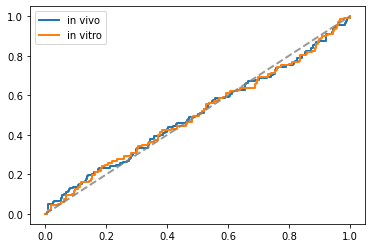

0.5030793795620437 0.5011119981751825


In [59]:

roc_vivo =  roc_auc_score(tetra_dmso_mutrate_df['unpair'].astype("bool").to_list(), tetra_dmso_mutrate_df['in_vivo'].to_list())
roc_vitro =  roc_auc_score(tetra_dmso_mutrate_df['unpair'].astype("bool").to_list(), tetra_dmso_mutrate_df['in_vitro'].to_list())


vivo_fpr, vivo_tpr, _ = roc_curve(tetra_dmso_mutrate_df['unpair'].astype("bool").to_list(), tetra_dmso_mutrate_df['in_vivo'].to_list())
vitro_fpr, vitro_tpr, _ = roc_curve(tetra_dmso_mutrate_df['unpair'].astype("bool").to_list(), tetra_dmso_mutrate_df['in_vitro'].to_list())


fig, ax = plt.subplots()
ax.plot(vivo_fpr, vivo_tpr, marker='.', label='in vivo', linewidth=2, markersize=0, ) #color="blue" 
ax.plot(vitro_fpr, vitro_tpr, marker='.', label='in vitro', linewidth=2, markersize=0, ) #color="blue" 

ax.plot([0, 1], [0, 1], linestyle="--", lw=2, color="grey", alpha=0.8)
plt.legend()
#plt.savefig("ROC.mutrate.dmso.pdf")
plt.show()
print (roc_vivo, roc_vitro)

## 6. 18S rRNA (mean2std)

In [8]:
rRNA_df = reac_df.loc["human_small"]
rRNA_df = rRNA_df.xs("in_vivo", level)

sample_id,RHX720,RHX727,RHX704,RHX705,RHX711,RHX712,RHX718,RHX719,RHX725,RHX726,...,RHX675,RHX680,RHX681,RHX682,RHX687,RHX688,RHX689,RHX694,RHX695,RHX696
transfer,18s,18s,in_vitro,in_vitro,in_vitro,in_vitro,in_vitro,in_vitro,in_vitro,in_vitro,...,in_vivo,in_vivo,in_vivo,in_vivo,in_vivo,in_vivo,in_vivo,in_vivo,in_vivo,in_vivo
treatment,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,...,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3,NAI_N3
ref,WT,WT,MT,MT,MT,MT,MT,MT,MT,MT,...,WT,WT,WT,WT,WT,WT,WT,WT,WT,WT
cell_id,R1,R2,M1,M9,M2,M10,M3,M11,M4,M12,...,W21,W6,W14,W22,W7,W15,W23,W8,W16,W24
pos,,,,,,,,,,,,,,,,,,,,,
1,0.081280,0.074086,0.051530,0.019438,0.065806,0.031305,0.057323,-0.012627,0.031656,-0.005680,...,0.035576,0.043550,0.052283,0.050964,0.070766,0.077747,0.045298,0.091674,0.118599,0.087473
2,-0.044263,-0.043943,0.049211,0.017971,0.060773,0.027394,0.051093,-0.016100,0.032541,-0.005757,...,0.044596,0.055716,0.051194,0.064693,0.076715,0.085378,0.050042,0.094031,0.112100,0.083646
3,-0.067773,-0.065638,0.053413,0.021289,0.062584,0.030842,0.055666,-0.010169,0.036141,-0.002388,...,0.045763,0.056962,0.053731,0.065119,0.078913,0.087367,0.052266,0.096479,0.113659,0.084279
4,-0.070956,-0.054419,0.017442,0.010074,0.016469,0.018416,0.020010,0.012011,0.022967,0.009701,...,0.022397,0.034975,0.015242,0.029999,0.025437,0.031961,0.019641,0.033780,0.032355,0.014656
5,0.018754,0.022785,-0.001613,-0.001709,-0.000644,0.000394,0.000037,0.002321,0.000271,-0.002181,...,0.001128,0.008035,0.003421,0.006183,0.003768,0.005901,0.007046,0.004277,0.004816,-0.001172
